In [54]:
import os
import warnings
warnings.filterwarnings(action='once')
from nilearn import datasets
from nilearn.input_data import NiftiMasker
import numpy as np
# cognitive annotations
import pandas as pd
import os
import sys
sys.path.insert(1, os.path.realpath(os.path.pardir))
import numpy as np
import matplotlib.pyplot as plt
from typing import Callable, Sequence, Any
from deepmeg.preprocessing.transforms import one_hot_encoder, zscore
from deepmeg.data.datasets import EpochsDataset
from deepmeg.models import BaseModel
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import torchmetrics
from deepmeg.training.callbacks import EarlyStopping, PrintingCallback, L2Reg
from deepmeg.utils.viz import plot_metrics
from functools import partial
from deepmeg.utils.convtools import compute_output_shape, conviter
import torch.nn.init as init
import math
from deepmeg.preprocessing.transforms import one_hot_encoder, one_hot_decoder
import nibabel as nb
import nilearn.plotting as nplt


def accuracy(predictions, targets):
    """
    Computes the accuracy metric for multiclass tasks with one-hot encoded labels.

    Args:
    - predictions: A PyTorch tensor of shape (batch_size, num_classes) representing the model's predictions.
    - targets: A PyTorch tensor of shape (batch_size, num_classes) representing the true labels in one-hot encoded format.

    Returns:
    - accuracy: A float value representing the accuracy metric.
    """

    # Convert one-hot encoded labels to class indices
    targets = torch.argmax(targets, dim=1)

    # Compute predicted class indices
    _, predicted = torch.max(predictions, dim=1)

    # Compute accuracy
    correct = torch.sum(predicted == targets)
    total = targets.shape[0]
    accuracy = correct / total

    return accuracy


def plot_2d_projections(matrix: np.ndarray, cmap=None) -> plt.Figure:
    """
    Plot the mean projections of a 3D matrix along the X, Y, and Z axes.

    Args:
        matrix (np.ndarray): A 3D matrix to plot.

    Returns:
        plt.Figure: A matplotlib Figure object containing the 2D projections along the X, Y, and Z axes.
    """
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))
    ax1.imshow(np.flip(matrix.mean(axis=0).T, 0), cmap=cmap)
    ax2.imshow(np.flip(matrix.mean(axis=1).T, 0), cmap=cmap)
    ax3.imshow(np.flip(matrix.mean(axis=2).T, 0), cmap=cmap)
    return fig

In [39]:
def mode_n_product(x, m, mode):
    x = np.asarray(x)
    m = np.asarray(m)
    if mode < 0:
        raise ValueError('`mode` must be a positive interger')
    if x.ndim < mode:
        raise ValueError('Invalid shape of X for mode = {}: {}'.format(mode, x.shape))
    if m.ndim != 2:
        raise ValueError('Invalid shape of M: {}'.format(m.shape))
    return np.swapaxes(np.swapaxes(x, mode, -1).dot(m.T), mode, -1)


A = np.reshape(np.arange(12) + 1, (2, 2, 3))
B = np.reshape(np.arange(6) + 1, (3, 2))

mode_n_product(A, B, 1)[0, :, :]

array([[ 9, 12, 15],
       [19, 26, 33],
       [29, 40, 51]])

In [53]:
x, y, z = 100, 100, 100
m, n, p = 10, 10, 10

print(
    x*n + y*m + z*p + m*n*p,
    x*m*p + n*y*p + n*m*z,
    (x*m*p + n*y*p + n*m*z) / (x*n + y*m + z*p + m*n*p)
)

4000 30000 7.5


In [36]:
B.shape, A.shape, mode_n_product(A, B, 1).shape

((3, 2), (2, 2, 3), (2, 3, 3))

In [38]:
B@A[0, :, :]

array([[ 9, 12, 15],
       [19, 26, 33],
       [29, 40, 51]])

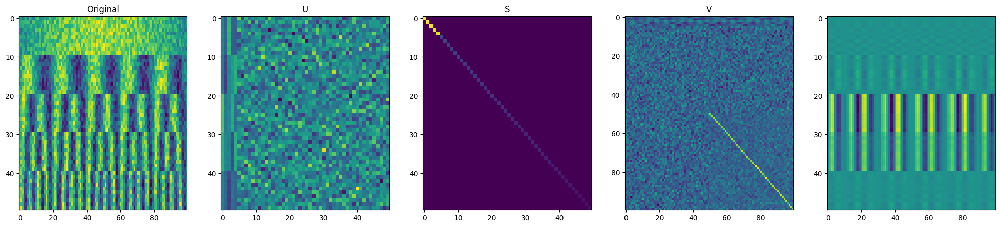

In [218]:
t = np.linspace(0, 1, 100)
a = np.array(
    [np.sin(1*np.pi*t) + (np.random.random(len(t)) - 0.5) for _ in range(10)] +
    [np.sin(10*np.pi*t) + (np.random.random(len(t)) - 0.5) for _ in range(10)] +
    [np.sin(20*np.pi*t) + (np.random.random(len(t)) - 0.5) for _ in range(10)] +
    [np.sin(30*np.pi*t) + (np.random.random(len(t)) - 0.5) for _ in range(10)] +
    [np.sin(40*np.pi*t) + (np.random.random(len(t)) - 0.5) for _ in range(10)]
)
U, S, V = np.linalg.svd(a, full_matrices=True)
fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5, figsize=(25, 5))
ax1.imshow(a, aspect='auto')
ax1.set_title('Original')
ax2.imshow(U, aspect='auto')
ax2.set_title('U')
ax3.imshow(np.diag(S), aspect='auto')
ax3.set_title('S')
ax4.imshow(V, aspect='auto')
ax4.set_title('V')
n = 0
low_rank = U[:, n:n+1] @ np.diag(S[n:n+1]) @ V[n:n+1, :]
ax5.imshow(low_rank, aspect='auto')


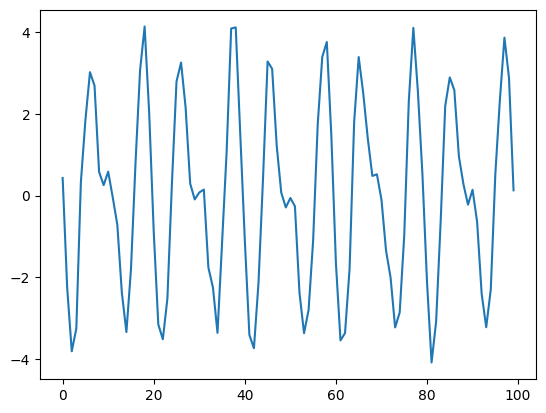

In [219]:
pca = sk.decomposition.PCA(n_components=1)
p = pca.fit_transform(low_rank.T)
plt.plot(p)

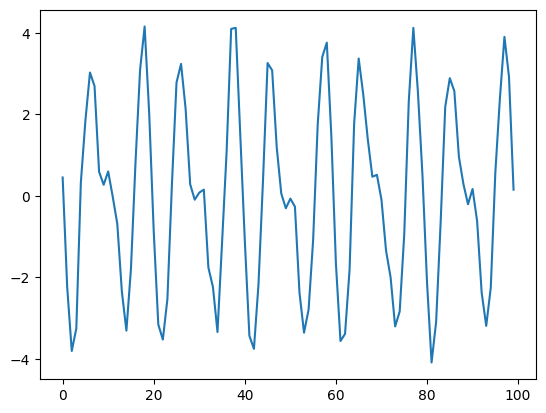

In [220]:
pca = sk.decomposition.PCA(n_components=1)
p = pca.fit_transform(a.T)
plt.plot(p)

/home/user/Projects/deepmeg/venv/lib/python3.11/site-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(


Text(0.5, 1.0, 'Reconstruction')

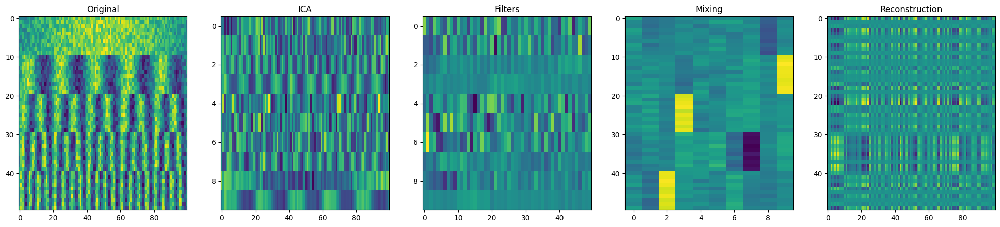

In [2]:
import sklearn as sk

ica = sk.decomposition.FastICA(n_components=10, max_iter=10000)
t = np.linspace(0, 1, 100)
# a = np.array([np.sin(30*np.pi*t) + np.cos(np.random.randint(1, 15)*np.pi*t) for _ in range(50)])
a = np.array(
    [np.sin(1*np.pi*t) + (np.random.random(len(t)) - 0.5) for _ in range(10)] +
    [np.sin(10*np.pi*t) + (np.random.random(len(t)) - 0.5) for _ in range(10)] +
    [np.sin(20*np.pi*t) + (np.random.random(len(t)) - 0.5) for _ in range(10)] +
    [np.sin(30*np.pi*t) + (np.random.random(len(t)) - 0.5) for _ in range(10)] +
    [np.sin(40*np.pi*t) + (np.random.random(len(t)) - 0.5) for _ in range(10)]
)
componens = ica.fit_transform(a.T)
fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5, figsize=(25, 5))
ax1.imshow(a, aspect='auto')
ax1.set_title('Original')
ax2.imshow(componens.T, aspect='auto')
ax2.set_title('ICA')
# _ = ax3.plot(componens)
ax3.imshow(ica.components_, aspect='auto')
ax3.set_title('Filters')
ax4.imshow(ica.mixing_, aspect='auto')
ax4.set_title('Mixing')
W = np.zeros(ica.mixing_.shape)
n = 0
W[:, 0] = ica.mixing_[:, 0]
ax5.imshow((componens@W.T).T, aspect='auto')
ax5.set_title('Reconstruction')

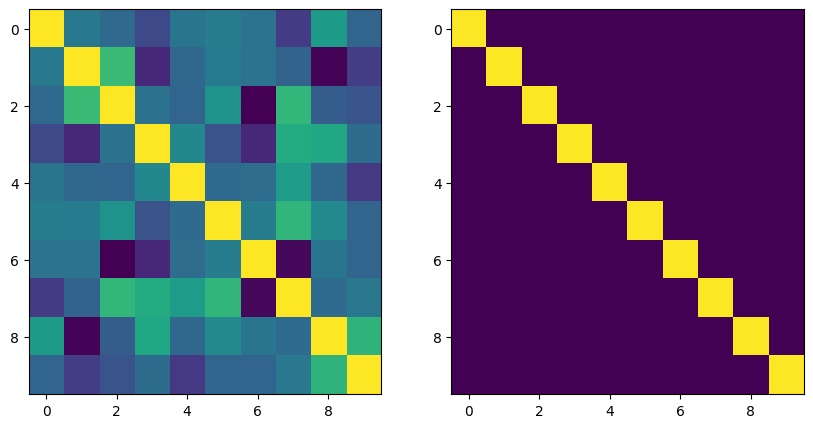

In [3]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

ax1.imshow(np.corrcoef(ica.components_), aspect='auto')
ax2.imshow(np.corrcoef(componens.T), aspect='auto')

Text(0.5, 1.0, 'PCA')

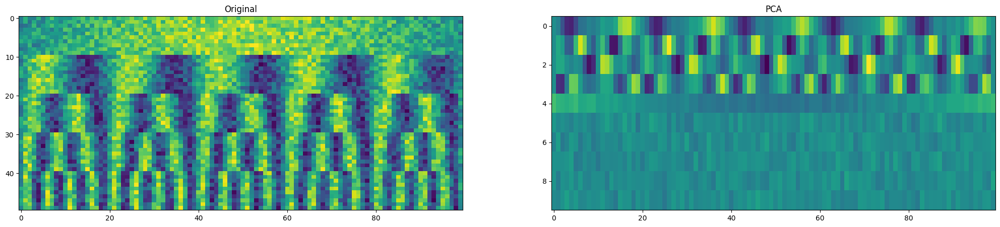

In [223]:
import sklearn as sk

pca = sk.decomposition.PCA(n_components=10)
t = np.linspace(0, 1, 100)
# a = np.array([np.sin(30*np.pi*t) + np.cos(np.random.randint(1, 15)*np.pi*t) for _ in range(50)])
a = np.array(
    [np.sin(1*np.pi*t) + (np.random.random(len(t)) - 0.5) for _ in range(10)] +
    [np.sin(10*np.pi*t) + (np.random.random(len(t)) - 0.5) for _ in range(10)] +
    [np.sin(20*np.pi*t) + (np.random.random(len(t)) - 0.5) for _ in range(10)] +
    [np.sin(30*np.pi*t) + (np.random.random(len(t)) - 0.5) for _ in range(10)] +
    [np.sin(40*np.pi*t) + (np.random.random(len(t)) - 0.5) for _ in range(10)]
)
componens = pca.fit_transform(a.T)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 5))
ax1.imshow(a, aspect='auto')
ax1.set_title('Original')
ax2.imshow(componens.T, aspect='auto')
ax2.set_title('PCA')


In [53]:

a = np.random.randint(0, 2, (200, 30, 10, 11))
b = np.random.randint(0, 2, (200, 30, 11, 10))

(a@b).shape

(200, 30, 10, 10)

In [56]:
from deepmeg.utils.colors import generate_cmap

cmap = generate_cmap(*[
    '#003535',
    '#00b2b2',
    # '#00ffff',
    # '#fff',
    '#b20000'
])

#### Data preprocessing

In [29]:
data_dir = os.path.join('..', 'data')
sub_no = 4
haxby_dataset = datasets.fetch_haxby(subjects=[sub_no], fetch_stimuli=True, data_dir=data_dir)

In [3]:
# We are fetching the data for subject 4
data_dir = os.path.join('..', 'data')
sub_no = 4
haxby_dataset = datasets.fetch_haxby(subjects=[sub_no], fetch_stimuli=True, data_dir=data_dir)
func_file = haxby_dataset.func[0]

# mask the data

# mask_filename = haxby_dataset.mask_vt[0]
mask_filename = '../data/haxby2001/mask.nii.gz'
masker = NiftiMasker(mask_img=mask_filename, standardize=True, detrend=True)
# masker = NiftiMasker(mask_img=mask_filename, standardize=False, detrend=False)
X = masker.fit_transform(func_file)
X_ = masker.inverse_transform(X)
# X_ = nb.load(func_file)
behavioral = pd.read_csv(haxby_dataset.session_target[0], delimiter=' ')
y = behavioral['labels']
labelsdict = {value: key for key, value in dict(enumerate(np.unique(y))).items()}
Y = one_hot_encoder(
    np.array([labelsdict[label] for label in y])
)

/home/user/Projects/deepmeg/venv/lib/python3.11/site-packages/nilearn/image/resampling.py:494: UserWarning: The provided image has no sform in its header. Please check the provided file. Results may not be as expected.
  warnings.warn(
/home/user/Projects/deepmeg/venv/lib/python3.11/site-packages/joblib/memory.py:349: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.13, the default strategy will be replaced by the new strategy and the 'zscore' option will be removed. Please use 'zscore_sample' instead.
  return self.func(*args, **kwargs)


In [14]:
haxby_dataset.mask_vt

['../data/haxby2001/subj4/mask4_vt.nii.gz']

In [3]:
Y.shape

(1452, 9)

In [4]:
X_.shape

(40, 64, 64, 1452)

In [5]:
X_.slicer[:, :, :, 0].shape

(40, 64, 64)

In [13]:
mask_filename = '../data/haxby2001/subj4/mask4_vt.nii.gz'
# mask_filename = '../data/haxby2001/mask.nii.gz'

In [23]:
brainmask = np.array(nb.load(mask_filename).dataobj)

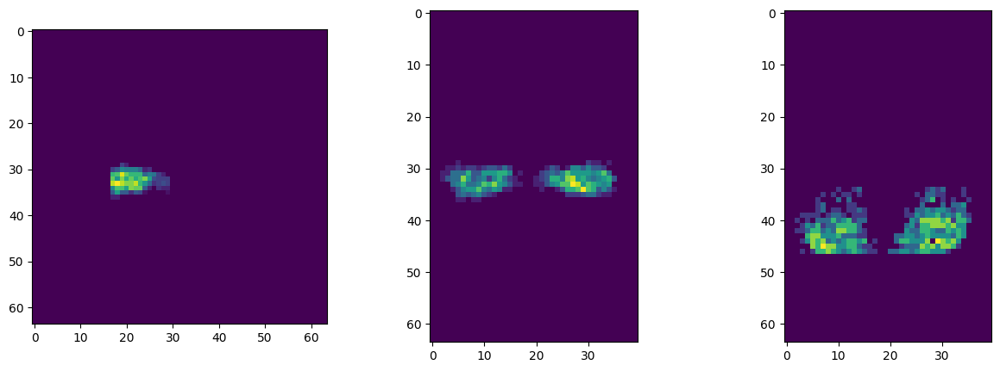

In [24]:
fig = plot_2d_projections(brainmask)

In [349]:
X = np.transpose(np.array(X_.dataobj), (3, 0, 1, 2))

In [111]:
X[:, :, :, 0].std(), X[:, :, :, 0].mean()

(0.0, 0.0)

In [4]:
X_flat = X.reshape(X.shape[0], -1)
X_flat = X_flat[np.where(X_flat != 0)]
X_flat.min(), X_flat.max(), X_flat.mean(), X_flat.std()

(-8.870585, 6.471078, 2.4909766e-10, 1.0)

In [5]:
noise = np.random.normal(X_flat.mean(), X_flat.std(), X.shape)*( - mask + 1)

In [7]:
X = X + noise

In [14]:
X.min(), X.max(), X.mean(), X.std()

(-8.870585, 6.471078, 1.144911e-11, 0.06418626)

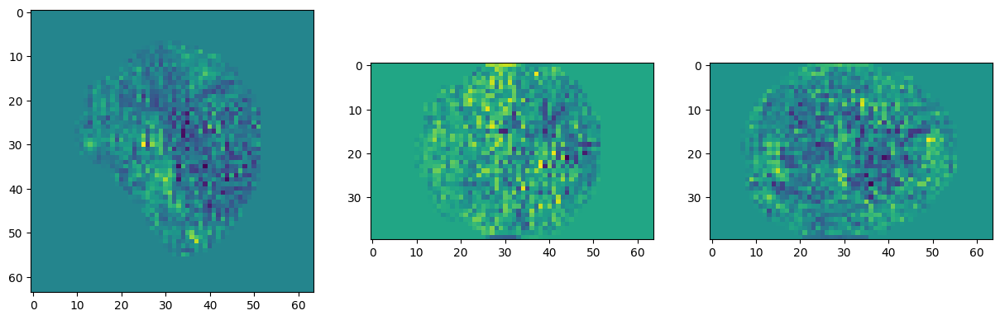

In [300]:
fig = plot_2d_projections(X[0, :, :, :])

In [10]:
X = X + noise

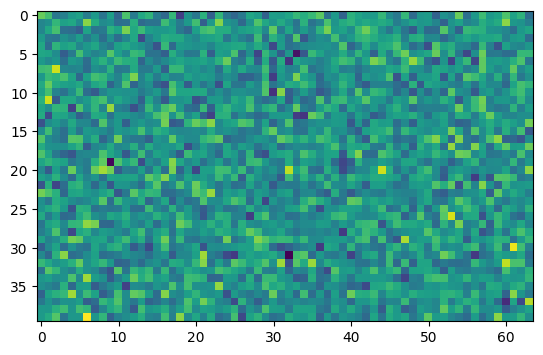

In [11]:

plt.imshow(X[0, :, 20, :])

In [301]:
X  = X[:, :, 15:-30, 25:-25]

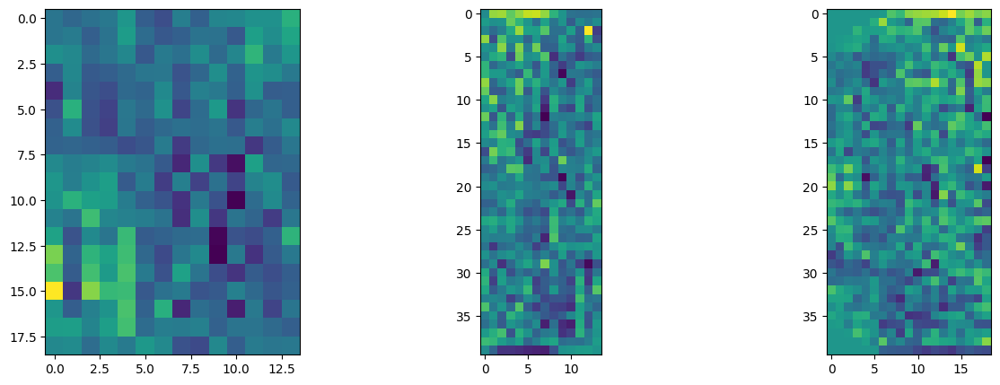

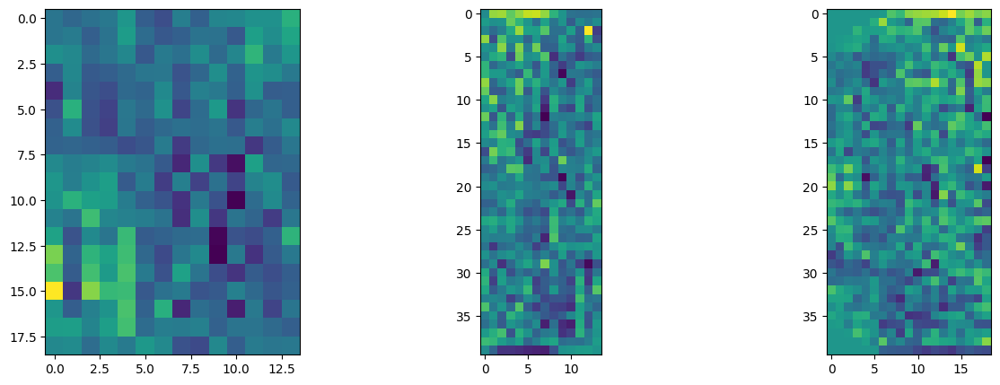

In [302]:
plot_2d_projections(X[0, :, :, :])

In [3]:
X_.slicer[:, 10:-35, 23:-27, 0].shape

(40, 19, 14)

In [55]:
cmap2 = generate_cmap(*[
    '#003535',
    '#00b2b2',
    # '#00ffff',
    # '#fff',
    # '#b20000'
])

html = nplt.view_img(nb.load(mask_filename), bg_img=haxby_dataset.anat[0], cmap=cmap2, colorbar=False)

NameError: name 'generate_cmap' is not defined

In [50]:
import imgkit


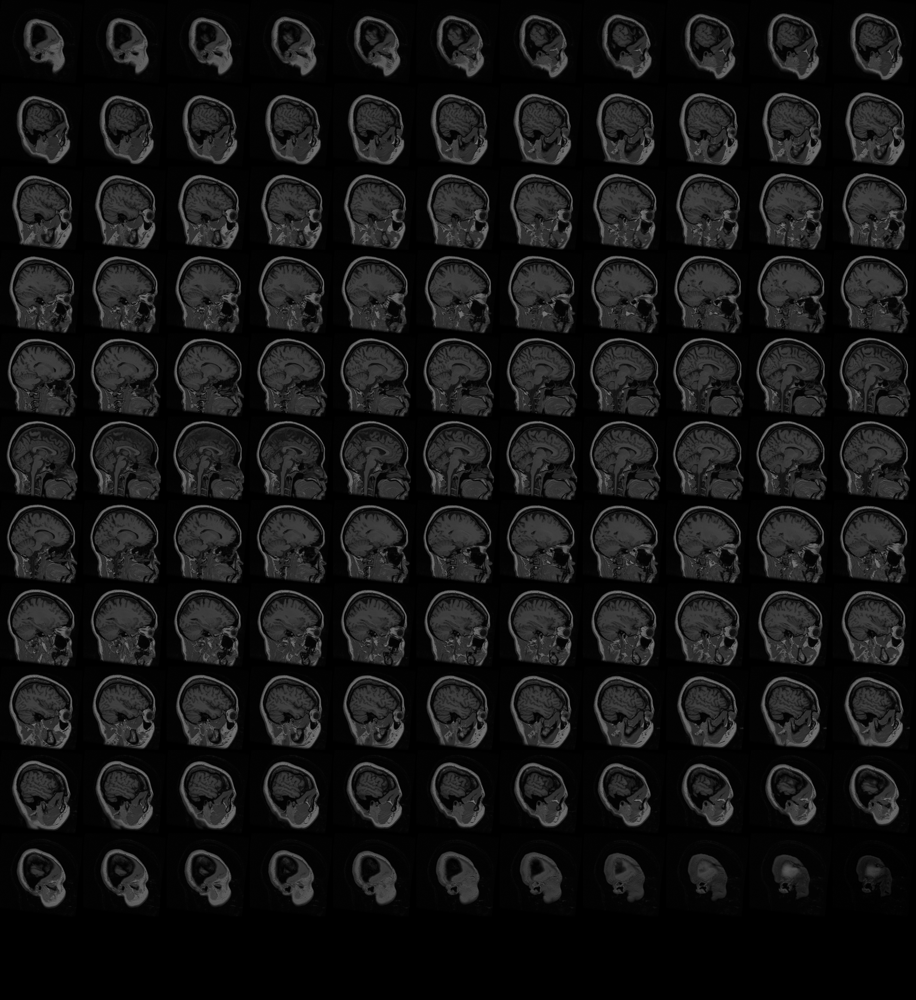
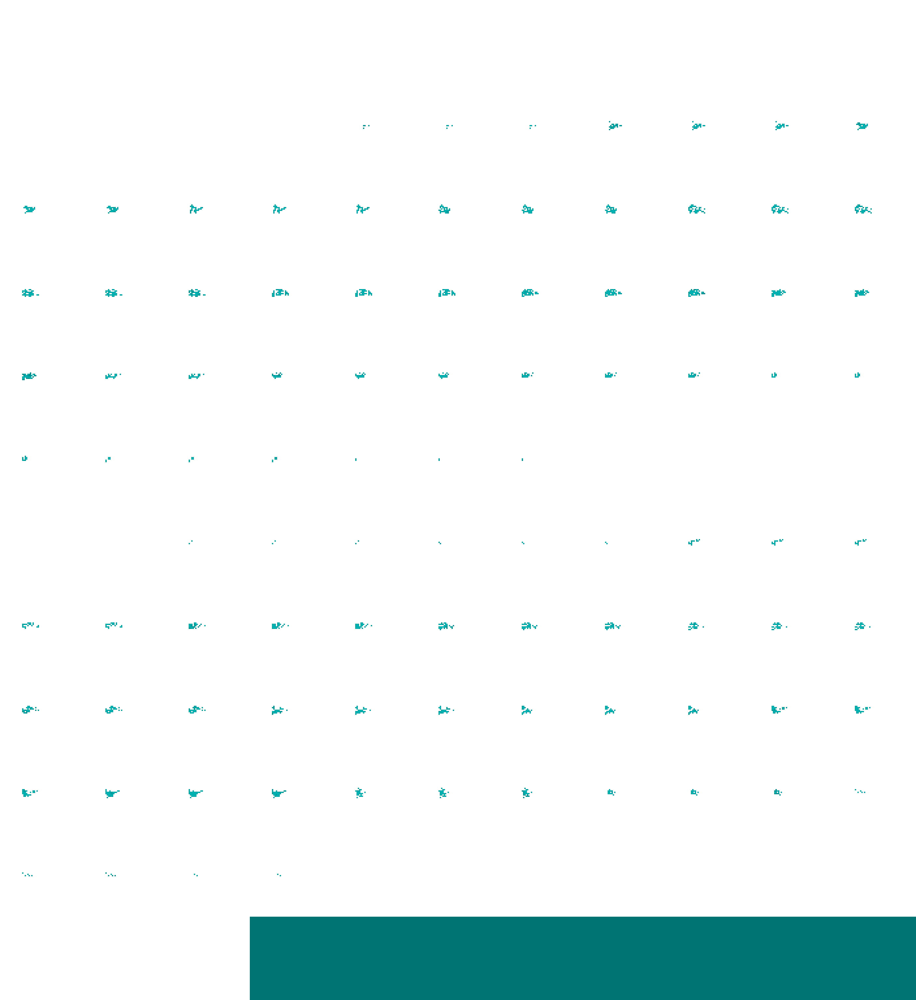

In [15]:
html

In [16]:
html.save_as_html('/home/user/Downloads/page.html')

In [8]:
cmap2 = generate_cmap(*[
    '#003535',
    '#00b2b2',
    # '#00ffff',
    # '#fff',
    # '#b20000'
])

html = nplt.view_img(X_.slicer[:, 10:-35, 23:-27, 0], bg_img=haxby_dataset.anat[0], cmap=cmap2, colorbar=False)

/home/user/Projects/deepmeg/venv/lib/python3.11/site-packages/numpy/core/fromnumeric.py:784: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


In [55]:
X = np.transpose(np.array(X_.dataobj)[:, 10:-35, 23:-27, :], (3, 0, 1, 2))

In [303]:
# mask = nb.load(haxby_dataset.mask_vt[0])
# mask = np.array(mask.dataobj)
X = np.array(X_.dataobj)
X = np.transpose(X[:, 15:-30, 25:-25], (3, 0, 1, 2))
# X = X*mask

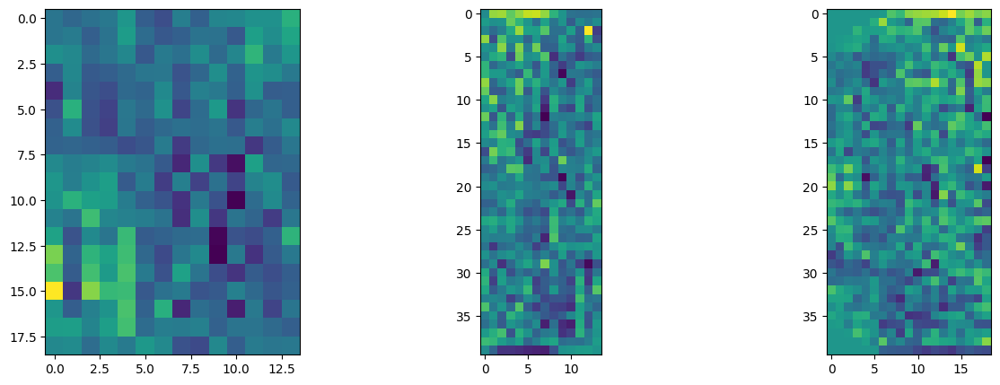

In [304]:
# X = (X - X.mean((1, 2, 3), keepdims=True))/X.std((1, 2, 3), keepdims=True)

fig = plot_2d_projections(X[0])

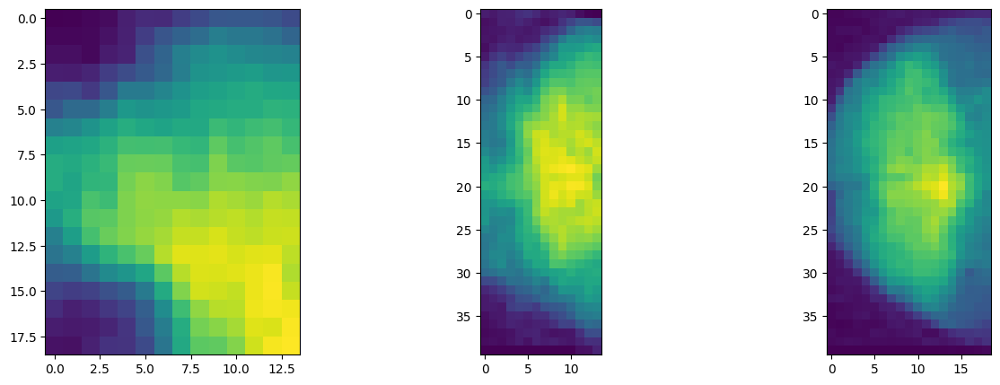

In [6]:
import scipy as sp
fig = plot_2d_projections(X[0])

In [305]:
X[0].min(), X[0].max()

(-6.644021, 6.170486)

In [ ]:
fig = plot_2d_projections(X[0])

In [18]:
X[0][20:, 15:-30, 25:-25].shape

(20, 19, 14)

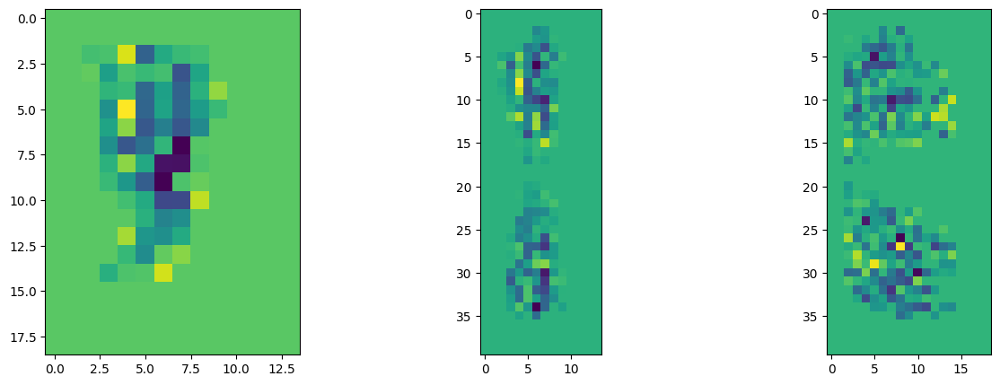

In [7]:
# fig = plot_2d_projections(X[0][:, 15:-30, 25:-25])
fig = plot_2d_projections(X[0])

In [348]:
X.shape

(1452, 39912)

In [118]:
X = X[:, :, 15:-30, 25:-25]

In [10]:
X.shape

(1452, 40, 19, 14)

In [ ]:
dataset = EpochsDataset((X, Y), savepath='../datasets/huxby_whole_brain', transform=zscore)
dataset.save('../data/huxby_whole_brain.pt')
train, test = torch.utils.data.random_split(dataset, [.7, .3])

In [57]:
dataset = EpochsDataset.load('../data/huxby_whole_brain.pt')
train, test = torch.utils.data.random_split(dataset, [.7, .3])

In [11]:
dataset = EpochsDataset((X, Y), savepath='../datasets/huxby_3d_noisy', transform=zscore)
dataset.save('../data/huxby_3d_noisy.pt')
train, test = torch.utils.data.random_split(dataset, [.7, .3])

In [244]:
dataset = EpochsDataset.load('../data/huxby_3d_noisy.pt')
train, test = torch.utils.data.random_split(dataset, [.7, .3])

In [8]:
dataset = EpochsDataset((X, Y), savepath='../datasets/huxby_3d_raw', transform=zscore)
dataset.save('../data/huxby_3d_raw.pt')
train, test = torch.utils.data.random_split(dataset, [.7, .3])

In [112]:
dataset = EpochsDataset.load('../data/huxby_3d_raw.pt')
train, test = torch.utils.data.random_split(dataset, [.7, .3])

In [306]:
dataset = EpochsDataset((X, Y), savepath='../datasets/huxby_3d_not_cropped_preprocessed')
dataset.save('../data/huxby_3d_not_cropped_preprocessed.pt')
train, test = torch.utils.data.random_split(dataset, [.7, .3])

In [2]:
dataset = EpochsDataset.load('../data/huxby_3d_not_cropped_preprocessed.pt')
train, test = torch.utils.data.random_split(dataset, [.7, .3])

In [53]:
import scipy as sp
X = sp.stats.zscore(X, axis=0)

In [ ]:
X.max()

In [119]:
dataset = EpochsDataset((X, Y), savepath='../datasets/huxby_3d', transform=zscore)
dataset.save('../data/huxby_3d.pt')
train, test = torch.utils.data.random_split(dataset, [.7, .3])

In [35]:
dataset = EpochsDataset.load('../data/huxby_3d.pt')
train, test = torch.utils.data.random_split(dataset, [.7, .3])

In [121]:
next(iter(DataLoader(train)))[0][0].min(), next(iter(DataLoader(train)))[0][0].max()

(tensor(-9.6526), tensor(11.0011))

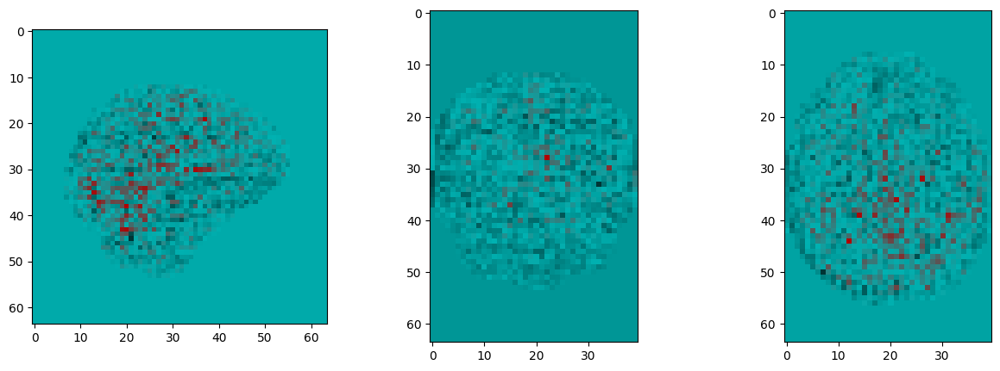

In [58]:
fig = plot_2d_projections(next(iter(DataLoader(train)))[0][0].numpy(), cmap=cmap)

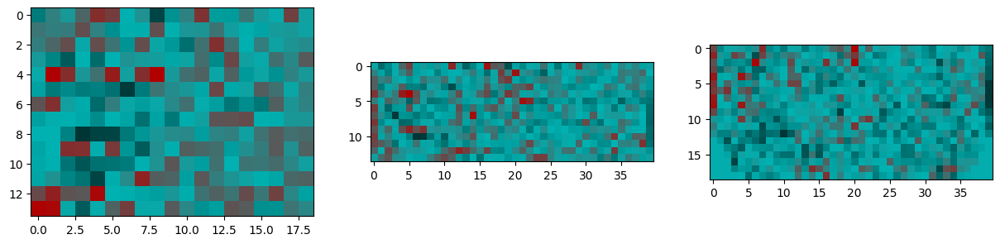

In [6]:
fig = plot_2d_projections(next(iter(DataLoader(train)))[0][0].numpy(), cmap=cmap)

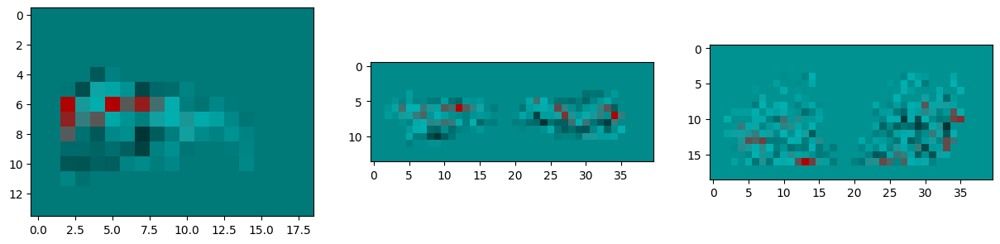

In [36]:
fig = plot_2d_projections(next(iter(DataLoader(train)))[0][0].numpy(), cmap=cmap)

#### m

In [27]:
class m(BaseModel):
    def __init__(
        self,
        in_channels,
        n_classes: int,
    ):
        super().__init__()
        self.n_classes = n_classes
        self.num_features = in_channels
        self.linear = nn.Linear(self.num_features, self.n_classes)


    def forward(self, x: torch.Tensor):
        x = self.linear(x)

        return x

In [68]:
X.shape, Y.shape

((1452, 40, 64, 64), torch.Size([1, 9]))

In [25]:
dataset = EpochsDataset((X, Y), savepath='../datasets/huxby_flat', transform=zscore)
dataset.save('../data/huxby_flat.pt')
train, test = torch.utils.data.random_split(dataset, [.7, .3])

In [28]:
X, Y = next(iter(DataLoader(train)))

In [39]:
model = m(
    in_channels=675,
    n_classes=Y.shape[1]
)

optimizer = torch.optim.Adam#W(model.parameters(), lr=1e-3)
loss = torch.nn.BCEWithLogitsLoss()
metric = accuracy

model.compile(
    optimizer,
    loss,
    metric,
    callbacks=[
        PrintingCallback(),
        # L2Reg(
        #     [
        #         'rc.wave1', 'rc.wave2', 'rc.wave3'
        #     ],
        #     0.01
        # ),
        EarlyStopping(monitor='loss_val', restore_best_weights=True, patience=5)
    ]
)

In [40]:
if hasattr(sys.stdout, 'file'):
    sys.stdout = sys.stdout.file

Epoch 0:  loss_train:  0.7107   |    accuracy_train:  0.1965   |    loss_val:  0.6897   |    accuracy_val:  0.2509
Epoch 1:  loss_train:  0.6695   |    accuracy_train:  0.3664   |    loss_val:  0.6749   |    accuracy_val:  0.3546
Epoch 2:  loss_train:  0.6479   |    accuracy_train:  0.4814   |    loss_val:  0.6640   |    accuracy_val:  0.4435
Epoch 3:  loss_train:  0.6315   |    accuracy_train:  0.5788   |    loss_val:  0.6559   |    accuracy_val:  0.5296
Epoch 4:  loss_train:  0.6178   |    accuracy_train:  0.6459   |    loss_val:  0.6485   |    accuracy_val:  0.5505
Epoch 5:  loss_train:  0.6060   |    accuracy_train:  0.6781   |    loss_val:  0.6417   |    accuracy_val:  0.5894
Epoch 6:  loss_train:  0.5957   |    accuracy_train:  0.7174   |    loss_val:  0.6355   |    accuracy_val:  0.6148
Epoch 7:  loss_train:  0.5867   |    accuracy_train:  0.7510   |    loss_val:  0.6305   |    accuracy_val:  0.6449
Epoch 8:  loss_train:  0.5786   |    accuracy_train:  0.7730   |    loss_val:  0

[<Figure size 640x480 with 1 Axes>, <Figure size 640x480 with 1 Axes>]

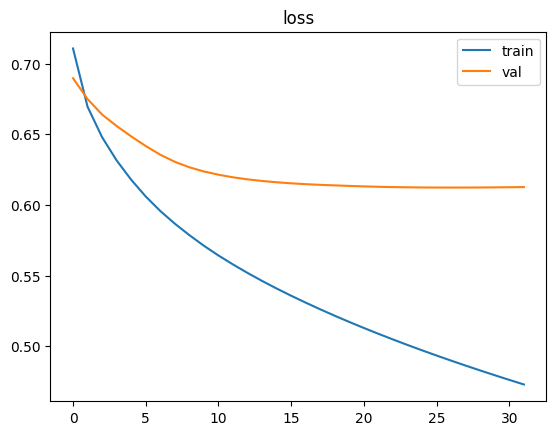

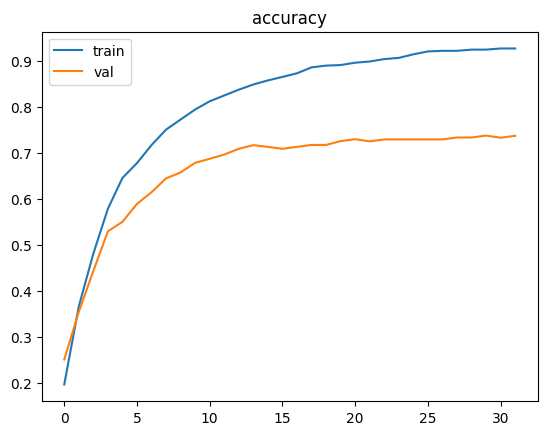

In [41]:
history = model.fit(train, n_epochs=150, batch_size=200, val_batch_size=60)
plot_metrics(history)

In [42]:
train_result = model.evaluate(train)
result = model.evaluate(test)

for measure, value in train_result.items():
    print(f'train_{measure}: {value}')

for measure, value in result.items():
    print(f'{measure}: {value}')

train_loss: 0.5245082947340879
train_accuracy: 0.8642149892720309
loss: 0.6293132088401101
accuracy: 0.7374207214875654


#### CC2

In [59]:
class ResConv3D(nn.Module):
    def __init__(
        self,
        in_channels,
        out_channels,
        input_size,
        kernel_size,
        stride=1,
        padding=0,
        bias=True,
    ):
        super().__init__()
        self.in_channels, self.out_channels = in_channels, out_channels
        self.kernel_size = kernel_size
        self.input_size = input_size
        self.stride = stride
        self.padding = padding
        self.wave1 = nn.Parameter(torch.empty(self.in_channels, self.kernel_size[0], self.input_size[1], self.input_size[2], self.out_channels))
        self.wave2 = nn.Parameter(torch.empty(self.in_channels, self.input_size[0], self.kernel_size[1], self.input_size[2], self.out_channels))
        self.wave3 = nn.Parameter(torch.empty(self.in_channels, self.input_size[0], self.input_size[1], self.kernel_size[2], self.out_channels))

        if bias:
            self.bias = nn.Parameter(torch.empty(out_channels))
        else:
            self.register_parameter('bias', None)

        self.reset_parameters()

    def reset_parameters(self) -> None:
        """Reset the layer parameters.
        Uses the Kaiming initialization method for the weight matrix and a uniform initialization method for the bias vector.
        """
        init.kaiming_uniform_(self.wave1, a=math.sqrt(5))
        init.kaiming_uniform_(self.wave2, a=math.sqrt(5))
        init.kaiming_uniform_(self.wave3, a=math.sqrt(5))

        if self.bias is not None:
            fan_in, _ = init._calculate_fan_in_and_fan_out(self.wave1)

            if fan_in != 0:
                bound = 1 / math.sqrt(fan_in)
                init.uniform_(self.bias, -bound, bound)


    def forward(self, x):
        convargs = ((x.shape[-3], x.shape[-2], x.shape[-1]), self.kernel_size, self.padding, self.stride)
        # print(convargs) # ((34, 43, 34), (10, 10, 10), 0, 'same')
        out_shape = compute_output_shape(*convargs)
        out_tensor = torch.zeros(x.shape[0], self.out_channels, *out_shape)
        b = self.bias if self.bias is not None else [0 for _ in range(self.out_channels)]

        for n_neuron in range(self.out_channels):
            for p, q, k in conviter(*convargs):
                x_slice = x[:, :, p[0], p[1], p[2]]
                w1_slice = self.wave1[:, k[0], p[1], p[2], n_neuron]
                w2_slice = self.wave2[:, p[0], k[1], p[2], n_neuron]
                w3_slice = self.wave3[:, p[0], p[1], k[2], n_neuron]
                # res = torch.unsqueeze(torch.unsqueeze((w1_slice*w2_slice*x_slice).sum((1, 2, 3)), -1), -1)
                # res = torch.unsqueeze(torch.unsqueeze(((w1_slice+w2_slice)*x_slice).sum((1, 2, 3)), -1), -1)
                # print(w1_slice.shape, w2_slice.shape, w3_slice.shape, x_slice.shape)
                res = ((w1_slice + w2_slice + w3_slice)*x_slice).sum((1, 2, 3, 4)) + b[n_neuron]
                # res = ((w1_slice + w2_slice)*x_slice).sum((1, 2, 3))
                # print(torch.squeeze(res).item(),w1_slice.item(), w2_slice.item(), x_slice.item())
                # print(out_tensor[:, n_neuron, q[-2], q[-1]].shape, res.shape)
                out_tensor[:, n_neuron, q[-3], q[-2], q[-1]] = res

        return out_tensor


class CC2(BaseModel):
    def __init__(
        self,
        in_channels,
        out_channels,
        input_size,
        kernel_size,
        maxpool_size,
        n_classes: int,
        stride=1,
        padding=0,
        dropout=None,
        batchnorm=False
    ):
        super().__init__()
        self.n_classes = n_classes
        self.rc = ResConv3D(in_channels, out_channels, input_size, kernel_size, stride, padding)
        # self.dp = None if dropout is None else nn.Dropout(dropout)
        self.dp = None if dropout is None else nn.Dropout(dropout)#nn.Dropout3d(dropout)
        self.relu = nn.Tanh()
        convargs = (input_size, kernel_size, padding, stride)
        self.convout_shape = compute_output_shape(*convargs)
        self.bn = nn.BatchNorm3d(out_channels) if batchnorm else None
        self.maxpool_size = maxpool_size
        self.maxpool = nn.MaxPool3d((maxpool_size, maxpool_size, maxpool_size), maxpool_size)
        # self.maxpool = nn.AvgPool3d((maxpool_size, maxpool_size, maxpool_size), maxpool_size)
        # self.conv = nn.Conv3d(
        #     out_channels, 1,
        #     kernel_size=(4, 3, 2),
        #     stride=(2, 1, 1),
        # )
        convargs = (self.convout_shape, (maxpool_size, maxpool_size, maxpool_size), 0, maxpool_size)
        # convargs = (self.convout_shape, (4, 3, 2), 0, (2, 1, 1))
        self.maxpool_shape = compute_output_shape(*convargs)#self.convout_shape#compute_output_shape(*convargs)
        self.num_features = out_channels*np.prod(self.maxpool_shape)
        # self.num_features = out_channels*np.prod(self.convout_shape)
        # self.num_features = np.prod(self.maxpool_shape)
        self.linear = nn.Linear(self.num_features, self.n_classes)


    def forward(self, x: torch.Tensor):
        x = torch.unsqueeze(x, 1)

        x = self.rc(x)
        # x = self.relu(x)
        # x = torch.abs(x)

        if self.dp:
            x = self.dp(x)
        if self.bn:
            x = self.bn(x)
        if self.maxpool_size > 1:
            x = self.maxpool(x)
        # x = self.conv(x)

        x = torch.flatten(x, start_dim=1)
        x = self.linear(x)

        return x

In [60]:
X, Y = next(iter(DataLoader(train)))

In [61]:
X[0].shape

torch.Size([40, 64, 64])

In [10]:
config = dict( #accuracy: 0.78
    in_channels=1,
    out_channels=2,
    input_size=X[0].shape,
    kernel_size=(5, 5, 5),
    maxpool_size=2,
    n_classes=Y.shape[-1],
    stride=2,
    dropout=.4,
    batchnorm=True
)
config = dict( # accuracy: 0.79
    in_channels=1,
    out_channels=2,
    input_size=X[0].shape,
    kernel_size=(15, 15, 10),
    maxpool_size=2,
    n_classes=Y.shape[-1],
    stride=1,
    dropout=.4,
    batchnorm=True
)

config = dict( # accuracy: 0.79
    in_channels=1,
    out_channels=3,
    input_size=X[0].shape,
    kernel_size=(15, 15, 10),
    maxpool_size=2,
    n_classes=Y.shape[-1],
    stride=1,
    dropout=.4,
    batchnorm=True
)

config = dict( # accuracy: 0.83; relu: 0.78; tanh: 0.84; full - 84
    in_channels=1,
    out_channels=5,
    input_size=X[0].shape,
    kernel_size=(15, 15, 10),
    maxpool_size=2,
    n_classes=Y.shape[-1],
    stride=1,
    dropout=.4,
    batchnorm=True
)

# config = dict( # accuracy: 0.82; full - 0.77
#     in_channels=1,
#     out_channels=5,
#     input_size=X[0].shape,
#     kernel_size=(15, 15, 10),
#     maxpool_size=2,
#     n_classes=Y.shape[-1],
#     stride=1,
#     dropout=.4,
#     batchnorm=False
# )

# config = dict( # accuracy: 0.71
#     in_channels=1,
#     out_channels=1,
#     input_size=X[0].shape,
#     kernel_size=(15, 15, 10),
#     maxpool_size=1,
#     n_classes=Y.shape[-1],
#     stride=1,
#     dropout=.4,
#     batchnorm=True
# )

# config = dict( #
#     in_channels=1,
#     out_channels=5,
#     input_size=X[0].shape,
#     kernel_size=(4, 4, 2),
#     maxpool_size=3,
#     n_classes=Y.shape[-1],
#     stride=(4, 4, 2),
#     dropout=.4,
#     batchnorm=False
# )

In [75]:
config = dict( # accuracy: 0.83; relu: 0.78; tanh: 0.84; full - 84
    in_channels=1,
    out_channels=3,
    input_size=X[0].shape,
    kernel_size=(10, 10, 10),
    maxpool_size=5,
    n_classes=Y.shape[-1],
    stride=5,
    dropout=.4,
    batchnorm=True
)

config = dict( # accuracy: 0.83; relu: 0.78; tanh: 0.84; full - 84
    in_channels=1,
    out_channels=1,
    input_size=X[0].shape,
    kernel_size=(15, 15, 15),
    maxpool_size=2,
    n_classes=Y.shape[-1],
    stride=5,
    dropout=.4,
    batchnorm=True
)

In [76]:
model = CC2(
    **config
)

optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3)
loss = torch.nn.BCEWithLogitsLoss()
metric = accuracy

model.compile(
    optimizer,
    loss,
    metric,
    callbacks=[
        PrintingCallback(),
        L2Reg(
            [
                'rc.wave1', 'rc.wave2', 'rc.wave3'
            ],
            0.01
        ),
        EarlyStopping(monitor='loss_val', restore_best_weights=True, patience=15)
    ]
)

In [77]:
model.convout_shape, model.maxpool_shape, model.num_features

((6, 10, 10), (3, 5, 5), 75)

In [78]:
model(X)

tensor([[-0.7915, -0.6009, -2.0517,  1.0977, -0.0046,  0.9601, -0.6498, -0.0141,
         -1.0054]], grad_fn=<AddmmBackward0>)

In [79]:
X.shape

torch.Size([1, 40, 64, 64])

In [80]:
if hasattr(sys.stdout, 'file'):
    sys.stdout = sys.stdout.file

Epoch 0:  loss_train:  0.6035   |    accuracy_train:  0.2535   |    loss_val:  0.3669   |    accuracy_val:  0.4056
Epoch 1:  loss_train:  0.4019   |    accuracy_train:  0.4088   |    loss_val:  0.3301   |    accuracy_val:  0.4972
Epoch 2:  loss_train:  0.3499   |    accuracy_train:  0.4664   |    loss_val:  0.3187   |    accuracy_val:  0.4745
Epoch 3:  loss_train:  0.3226   |    accuracy_train:  0.4658   |    loss_val:  0.3146   |    accuracy_val:  0.4690
Epoch 4:  loss_train:  0.3124   |    accuracy_train:  0.4523   |    loss_val:  0.3128   |    accuracy_val:  0.4560
Epoch 5:  loss_train:  0.3029   |    accuracy_train:  0.4692   |    loss_val:  0.3116   |    accuracy_val:  0.4560
Epoch 6:  loss_train:  0.2956   |    accuracy_train:  0.4771   |    loss_val:  0.3105   |    accuracy_val:  0.4685
Epoch 7:  loss_train:  0.2898   |    accuracy_train:  0.5196   |    loss_val:  0.3094   |    accuracy_val:  0.4856
Epoch 8:  loss_train:  0.2795   |    accuracy_train:  0.5714   |    loss_val:  0

[<Figure size 640x480 with 1 Axes>, <Figure size 640x480 with 1 Axes>]

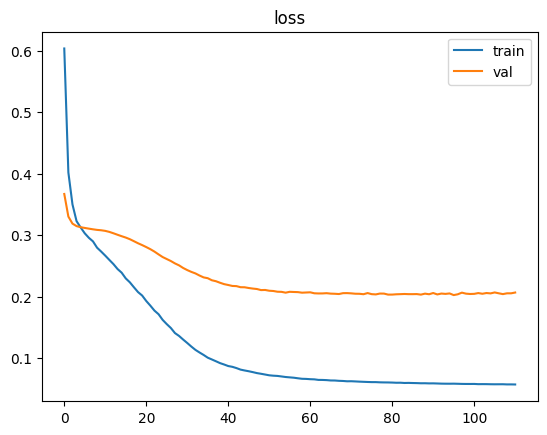

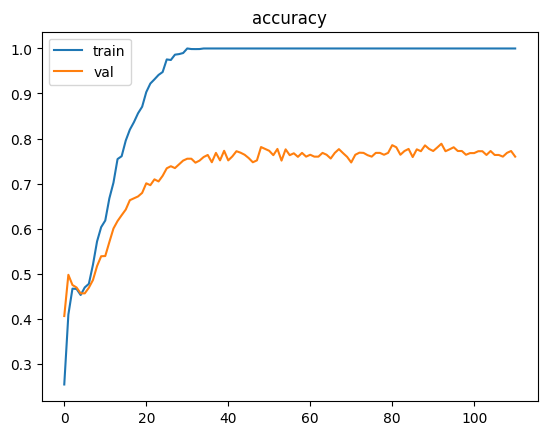

In [81]:
history = model.fit(train, n_epochs=150, batch_size=200, val_batch_size=60)
plot_metrics(history)

In [82]:
train_result = model.evaluate(train)
result = model.evaluate(test)

for measure, value in train_result.items():
    print(f'train_{measure}: {value}')

for measure, value in result.items():
    print(f'{measure}: {value}')

train_loss: 0.09573797475207936
train_accuracy: 0.9540954232215881
loss: 0.20022963664748453
accuracy: 0.8084566538984125


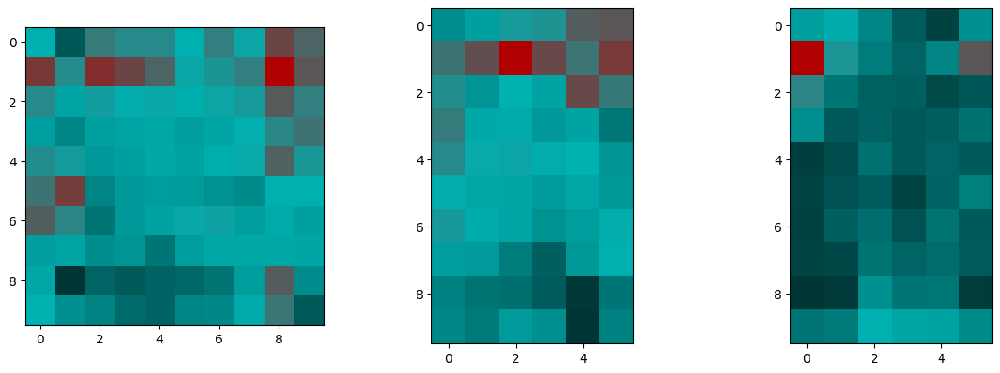

In [83]:
mask = model.rc(torch.ones(1, 1, *X[0].shape))
mask = mask.detach().numpy()
for i in range(mask.shape[1]):
    fig = plot_2d_projections(mask[0, i], cmap=cmap)
    plt.show()

In [84]:
@torch.no_grad()
def get_mask(shape, layer):
    convargs = ((shape[-3], shape[-2], shape[-1]), layer.kernel_size, layer.padding, layer.stride)
    out_tensor = torch.zeros(*shape, layer.out_channels)
    mask = torch.zeros(*shape, layer.out_channels)

    for n_neuron in range(layer.out_channels):
        for p, q, k in conviter(*convargs):
            w1_slice = layer.wave1[:, k[0], p[1], p[2], n_neuron]
            w2_slice = layer.wave2[:, p[0], k[1], p[2], n_neuron]
            w3_slice = layer.wave3[:, p[0], p[1], k[2], n_neuron]
            res = (w1_slice + w2_slice + w3_slice)
            out_tensor[:, p[-3], p[-2], p[-1], n_neuron] += res
            mask[:, p[-3], p[-2], p[-1], n_neuron] += 1
    mask[mask == 0] = 1
    return out_tensor/mask

In [20]:
X.shape

torch.Size([1, 40, 19, 14])

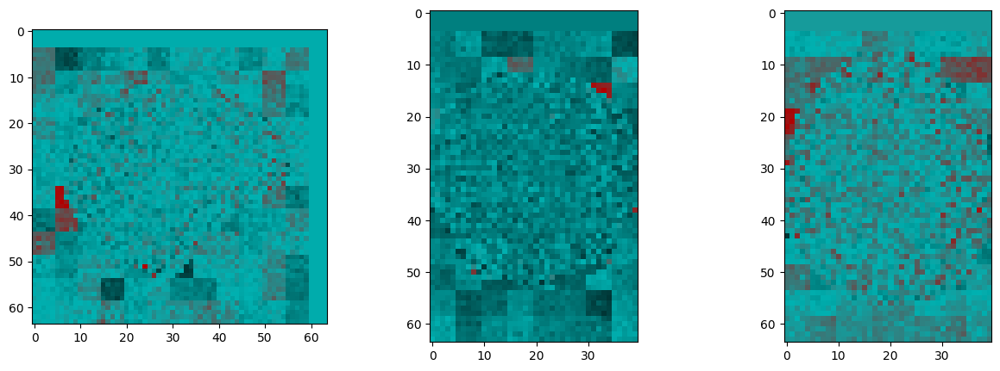

In [85]:
mask = torch.squeeze(get_mask(
    next(iter(DataLoader(test)))[0].shape, model.rc
))
if mask.ndim > 3:
    for i in range(mask.shape[-1]):
        fig = plot_2d_projections(mask.detach()[:, :, :, i].numpy(), cmap=cmap)
        plt.show()
else:
    fig = plot_2d_projections(mask.detach()[:, :, :].numpy(), cmap=cmap)
    plt.show()

In [25]:
mask = torch.squeeze(get_mask(
    next(iter(DataLoader(test)))[0].shape, model.rc
))
if mask.ndim > 3:
    for i in range(mask.shape[-1]):
        fig = plot_2d_projections(mask.detach()[:, :, :, i].numpy()*brainmask, cmap=cmap)
        plt.show()
else:
    fig = plot_2d_projections(mask.detach()[:, :, :].numpy()*brainmask, cmap=cmap)
    plt.show()

ValueError: operands could not be broadcast together with shapes (40,19,14) (40,64,64) 

#### ResConc

In [23]:
class ResConc3D(nn.Module):
    def __init__(
        self,
        in_channels,
        out_channels,
        input_size,
        kernel_size,
        stride=1,
        padding=0,
        bias=True,
    ):
        super().__init__()
        self.in_channels, self.out_channels = in_channels, out_channels
        self.kernel_size = kernel_size
        self.input_size = input_size
        self.stride = stride
        self.padding = padding
        self.wave1 = nn.Parameter(torch.empty(self.in_channels, self.kernel_size[0], self.input_size[1], self.input_size[2], self.out_channels))
        self.wave2 = nn.Parameter(torch.empty(self.in_channels, self.input_size[0], self.kernel_size[1], self.input_size[2], self.out_channels))
        self.wave3 = nn.Parameter(torch.empty(self.in_channels, self.input_size[0], self.input_size[1], self.kernel_size[2], self.out_channels))

        if bias:
            self.bias = nn.Parameter(torch.empty(out_channels))
        else:
            self.register_parameter('bias', None)

        self.reset_parameters()

    def reset_parameters(self) -> None:
        """Reset the layer parameters.
        Uses the Kaiming initialization method for the weight matrix and a uniform initialization method for the bias vector.
        """
        init.kaiming_uniform_(self.wave1, a=math.sqrt(5))
        init.kaiming_uniform_(self.wave2, a=math.sqrt(5))
        init.kaiming_uniform_(self.wave3, a=math.sqrt(5))

        if self.bias is not None:
            fan_in, _ = init._calculate_fan_in_and_fan_out(self.wave1)

            if fan_in != 0:
                bound = 1 / math.sqrt(fan_in)
                init.uniform_(self.bias, -bound, bound)
    @staticmethod
    @torch.no_grad()
    def get_mask(shape, layer):
        convargs = ((shape[-3], shape[-2], shape[-1]), layer.kernel_size, layer.padding, layer.stride)
        out_tensor = torch.zeros(*shape, layer.out_channels)
        mask = torch.zeros(*shape, layer.out_channels)

        for n_neuron in range(layer.out_channels):
            for p, q, k in conviter(*convargs):
                w1_slice = layer.wave1[:, k[0], p[1], p[2], n_neuron]
                w2_slice = layer.wave2[:, p[0], k[1], p[2], n_neuron]
                w3_slice = layer.wave3[:, p[0], p[1], k[2], n_neuron]
                res = (w1_slice + w2_slice + w3_slice)
                out_tensor[:, p[-3], p[-2], p[-1], n_neuron] += res
                mask[:, p[-3], p[-2], p[-1], n_neuron] += 1
        mask[mask == 0] = 1
        return out_tensor/mask

    def forward(self, x):
        convargs = ((x.shape[-3], x.shape[-2], x.shape[-1]), self.kernel_size, self.padding, self.stride)
        out_tensor = torch.zeros(x.shape[0], self.out_channels, x.shape[-3], x.shape[-2], x.shape[-1])
        mask = torch.zeros_like(out_tensor)
        b = self.bias if self.bias is not None else [0 for _ in range(self.out_channels)]

        for n_neuron in range(self.out_channels):
            for p, q, k in conviter(*convargs):
                x_slice = x[:, :, p[0], p[1], p[2]]
                w1_slice = self.wave1[:, k[0], p[1], p[2], n_neuron]
                w2_slice = self.wave2[:, p[0], k[1], p[2], n_neuron]
                w3_slice = self.wave3[:, p[0], p[1], k[2], n_neuron]
                res = ((w1_slice + w2_slice + w3_slice)*x_slice).sum(1) + b[n_neuron]
                out_tensor[:, n_neuron, p[-3], p[-2], p[-1]] += res
                mask[:, n_neuron, p[-3], p[-2], p[-1]] += 1

        mask[mask == 0] = 1
        return out_tensor/mask

    # def forward(self, x):
    #     convargs = ((x.shape[-3], x.shape[-2], x.shape[-1]), self.kernel_size, self.padding, self.stride)
    #     # print(convargs) # ((34, 43, 34), (10, 10, 10), 0, 'same')
    #     out_shape = compute_output_shape(*convargs)
    #     out_tensor = torch.zeros(x.shape[0], self.out_channels, *out_shape)
    #     b = self.bias if self.bias is not None else [0 for _ in range(self.out_channels)]

    #     for n_neuron in range(self.out_channels):
    #         for p, q, k in conviter(*convargs):
    #             x_slice = x[:, :, p[0], p[1], p[2]]
    #             w1_slice = self.wave1[:, k[0], p[1], p[2], n_neuron]
    #             w2_slice = self.wave2[:, p[0], k[1], p[2], n_neuron]
    #             w3_slice = self.wave3[:, p[0], p[1], k[2], n_neuron]
    #             # res = torch.unsqueeze(torch.unsqueeze((w1_slice*w2_slice*x_slice).sum((1, 2, 3)), -1), -1)
    #             # res = torch.unsqueeze(torch.unsqueeze(((w1_slice+w2_slice)*x_slice).sum((1, 2, 3)), -1), -1)
    #             # print(w1_slice.shape, w2_slice.shape, w3_slice.shape, x_slice.shape)
    #             res = ((w1_slice + w2_slice + w3_slice)*x_slice).sum((1, 2, 3, 4)) + b[n_neuron]
    #             # res = ((w1_slice + w2_slice)*x_slice).sum((1, 2, 3))
    #             # print(torch.squeeze(res).item(),w1_slice.item(), w2_slice.item(), x_slice.item())
    #             # print(out_tensor[:, n_neuron, q[-2], q[-1]].shape, res.shape)
    #             out_tensor[:, n_neuron, q[-3], q[-2], q[-1]] = res

    #     return out_tensor


layer = ResConc3D(
    2, 1, X.shape[1:],
    kernel_size=(10, 10, 10)
)
layer(torch.rand(20, 2, 40, 19, 14)).shape

torch.Size([20, 1, 40, 19, 14])

In [107]:
torch.unsqueeze(X, 1).shape

torch.Size([2, 1, 40, 19, 14])

In [ ]:
X.shape

torch.Size([2, 40, 19, 14])

In [55]:
class CC3(BaseModel):
    def __init__(
        self,
        in_channels,
        out_channels,
        input_size,
        kernel_size,
        maxpool_size,
        n_classes: int,
        stride=1,
        padding=0,
        dropout=None,
        batchnorm=False
    ):
        super().__init__()
        self.n_classes = n_classes
        self.rc = ResConc3D(in_channels, out_channels, input_size, kernel_size, stride, padding)
        self.dp = None if dropout is None else nn.Dropout(dropout)
        self.relu = nn.ReLU()
        convargs = (input_size, kernel_size, padding, stride)
        self.convout_shape = input_size#compute_output_shape(*convargs)
        self.bn = nn.BatchNorm3d(out_channels) if batchnorm else None
        self.maxpool_size = maxpool_size
        self.maxpool = nn.MaxPool3d((maxpool_size, maxpool_size, maxpool_size), maxpool_size)
        # self.conv = nn.Conv3d(
        #     out_channels, 1,
        #     kernel_size=(4, 3, 2),
        #     stride=(2, 1, 1),
        # )
        convargs = (self.convout_shape, (maxpool_size, maxpool_size, maxpool_size), 0, maxpool_size)
        # convargs = (self.convout_shape, (4, 3, 2), 0, (2, 1, 1))
        self.maxpool_shape = compute_output_shape(*convargs)#self.convout_shape#compute_output_shape(*convargs)
        self.num_features = out_channels*np.prod(self.maxpool_shape)
        # self.num_features = out_channels*np.prod(self.convout_shape)
        # self.num_features = np.prod(self.maxpool_shape)
        self.linear = nn.Linear(self.num_features, self.n_classes)


    def forward(self, x: torch.Tensor):
        x = torch.unsqueeze(x, 1)
        x = self.rc(x)
        if self.dp:
            x = self.dp(x)
        if self.bn:
            x = self.bn(x)
        # x = self.relu(x)
        if self.maxpool_size > 1:
            x = self.maxpool(x)
        # x = self.conv(x)

        x = torch.flatten(x, start_dim=1)
        x = self.linear(x)

        return x

In [56]:
X, Y = next(iter(DataLoader(train, 20)))

In [64]:
config = dict( # accuracy: 0.59
    in_channels=1,
    out_channels=1,
    input_size=X[0].shape,
    kernel_size=(15, 15, 10),
    maxpool_size=5,
    n_classes=Y.shape[-1],
    stride=1,
    dropout=.4,
    batchnorm=True
)

config = dict( # accuracy: 0.56
    in_channels=1,
    out_channels=2,
    input_size=X[0].shape,
    kernel_size=(15, 15, 10),
    maxpool_size=5,
    n_classes=Y.shape[-1],
    stride=1,
    dropout=.4,
    batchnorm=True
)

config = dict( # accuracy: 0.56
    in_channels=1,
    out_channels=5,
    input_size=X[0].shape,
    kernel_size=(15, 15, 10),
    maxpool_size=5,
    n_classes=Y.shape[-1],
    stride=(15, 15, 10),
    dropout=.4,
    batchnorm=True
)

In [65]:
model = CC3(
    **config
)

optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3)
loss = torch.nn.BCEWithLogitsLoss()
metric = accuracy

model.compile(
    optimizer,
    loss,
    metric,
    callbacks=[
        PrintingCallback(),
        L2Reg(
            [
                'rc.wave1', 'rc.wave2', 'rc.wave3'
            ],
            0.01
        ),
        EarlyStopping(monitor='loss_val', restore_best_weights=True, patience=5)
    ]
)

In [66]:
model.convout_shape, model.maxpool_shape, model.num_features

(torch.Size([40, 19, 14]), (8, 3, 2), 240)

In [67]:
if hasattr(sys.stdout, 'file'):
    sys.stdout = sys.stdout.file

Epoch 0:  loss_train:  0.5903   |    accuracy_train:  0.3104   |    loss_val:  0.7075   |    accuracy_val:  0.0690
Epoch 1:  loss_train:  0.3252   |    accuracy_train:  0.4134   |    loss_val:  0.7065   |    accuracy_val:  0.0778
Epoch 2:  loss_train:  0.2718   |    accuracy_train:  0.5297   |    loss_val:  0.7055   |    accuracy_val:  0.1278
Epoch 3:  loss_train:  0.2424   |    accuracy_train:  0.5988   |    loss_val:  0.7014   |    accuracy_val:  0.2056
Epoch 4:  loss_train:  0.2232   |    accuracy_train:  0.6957   |    loss_val:  0.6925   |    accuracy_val:  0.3208
Epoch 5:  loss_train:  0.2082   |    accuracy_train:  0.7354   |    loss_val:  0.6837   |    accuracy_val:  0.3894
Epoch 6:  loss_train:  0.1932   |    accuracy_train:  0.7708   |    loss_val:  0.6745   |    accuracy_val:  0.3889
Epoch 7:  loss_train:  0.1839   |    accuracy_train:  0.8084   |    loss_val:  0.6591   |    accuracy_val:  0.3968
Epoch 8:  loss_train:  0.1777   |    accuracy_train:  0.8386   |    loss_val:  0

[<Figure size 640x480 with 1 Axes>, <Figure size 640x480 with 1 Axes>]

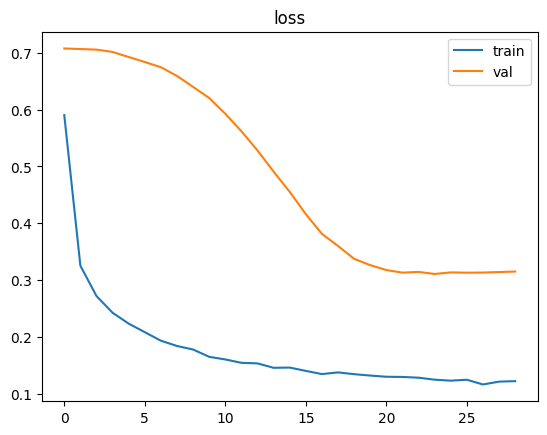

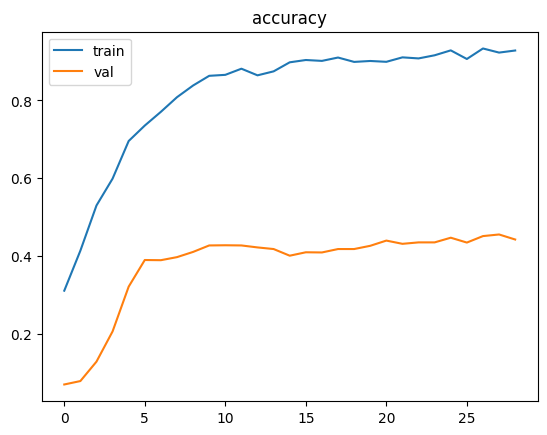

In [69]:
history = model.fit(train, n_epochs=150, batch_size=200, val_batch_size=60)
plot_metrics(history)

In [70]:
train_result = model.evaluate(train)
result = model.evaluate(test)

for measure, value in train_result.items():
    print(f'train_{measure}: {value}')

for measure, value in result.items():
    print(f'{measure}: {value}')

train_loss: 0.16560275784947656
train_accuracy: 0.8775877519087358
loss: 0.3101411895318465
accuracy: 0.44947146421129053


In [71]:
out = model.rc(torch.ones(1, 1, 40, 19, 14))[0, 0]

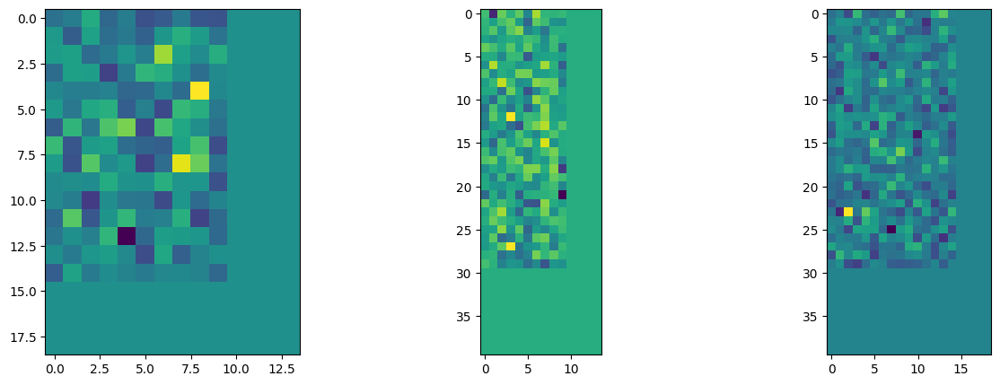

In [72]:
fig = plot_2d_projections(out.detach())

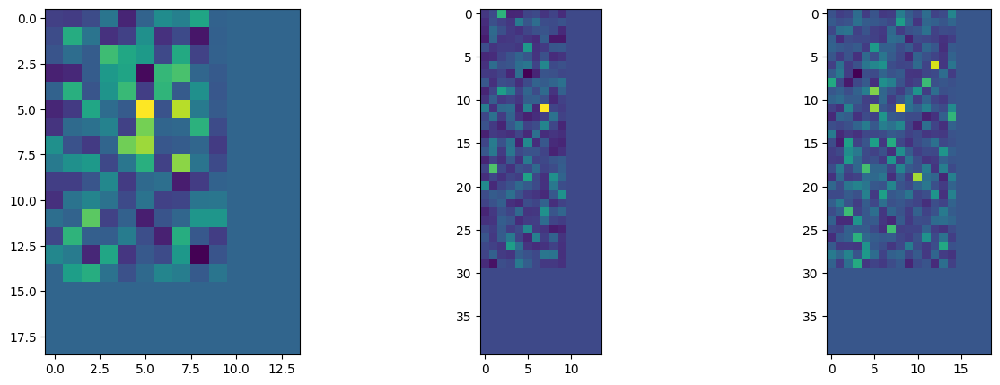

In [73]:
out = model.rc(torch.ones(1, 1, 40, 19, 14))
out = model.rc(out)[0, 0]
fig = plot_2d_projections(out.detach())

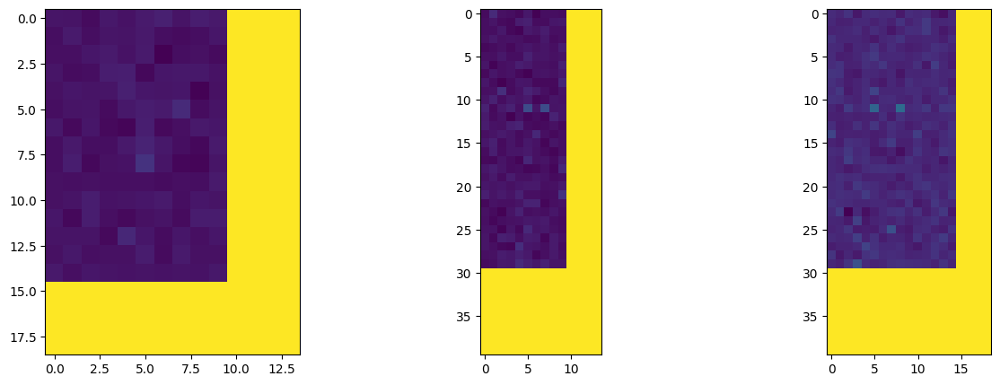

In [74]:
out = model.rc(torch.ones(1, 1, 40, 19, 14))
out = model.rc(out)
out = model.rc(out)
out = model.rc(out)[0, 0]
fig = plot_2d_projections(out.detach())

#### ResConv 3d mini

In [4]:
class ResConv3D1(nn.Module):
    def __init__(
        self,
        in_channels,
        out_channels,
        input_size,
        kernel_size,
        stride=1,
        padding=0,
        bias=True,
    ):
        super().__init__()
        self.in_channels, self.out_channels = in_channels, out_channels
        self.kernel_size = kernel_size
        self.input_size = input_size
        self.stride = stride
        self.padding = padding
        self.wave1 = nn.Parameter(torch.empty(self.in_channels, self.kernel_size[0], self.kernel_size[1], self.input_size[2], self.out_channels))
        self.wave2 = nn.Parameter(torch.empty(self.in_channels, self.input_size[0], self.kernel_size[1], self.kernel_size[2], self.out_channels))
        self.wave3 = nn.Parameter(torch.empty(self.in_channels, self.kernel_size[0], self.input_size[1], self.kernel_size[2], self.out_channels))

        if bias:
            self.bias = nn.Parameter(torch.empty(out_channels))
        else:
            self.register_parameter('bias', None)

        self.reset_parameters()

    def reset_parameters(self) -> None:
        """Reset the layer parameters.
        Uses the Kaiming initialization method for the weight matrix and a uniform initialization method for the bias vector.
        """
        init.kaiming_uniform_(self.wave1, a=math.sqrt(5))
        init.kaiming_uniform_(self.wave2, a=math.sqrt(5))
        init.kaiming_uniform_(self.wave3, a=math.sqrt(5))

        if self.bias is not None:
            fan_in, _ = init._calculate_fan_in_and_fan_out(self.wave1)

            if fan_in != 0:
                bound = 1 / math.sqrt(fan_in)
                init.uniform_(self.bias, -bound, bound)


    def forward(self, x):
        convargs = ((x.shape[-3], x.shape[-2], x.shape[-1]), self.kernel_size, self.padding, self.stride)
        out_shape = compute_output_shape(*convargs)
        out_tensor = torch.zeros(x.shape[0], self.out_channels, *out_shape)

        for n_neuron in range(self.out_channels):
            for p, q, k in conviter(*convargs):
                x_slice = x[:, :, p[0], p[1], p[2]]
                w1_slice = self.wave1[:, k[0], k[1], p[2], n_neuron]
                w2_slice = self.wave2[:, p[0], k[1], k[2], n_neuron]
                w3_slice = self.wave3[:, k[0], p[1], k[2], n_neuron]
                # res = torch.unsqueeze(torch.unsqueeze((w1_slice*w2_slice*x_slice).sum((1, 2, 3)), -1), -1)
                # res = torch.unsqueeze(torch.unsqueeze(((w1_slice+w2_slice)*x_slice).sum((1, 2, 3)), -1), -1)
                res = ((w1_slice + w2_slice + w3_slice)*x_slice).sum((1, 2, 3, 4))
                # res = ((w1_slice + w2_slice)*x_slice).sum((1, 2, 3))
                # print(torch.squeeze(res).item(),w1_slice.item(), w2_slice.item(), x_slice.item())
                # print(out_tensor[:, n_neuron, q[-2], q[-1]].shape, res.shape)
                out_tensor[:, n_neuron, q[-3], q[-2], q[-1]] = res

        return out_tensor

In [37]:
from deepmeg.models import BaseModel

class CC2m(BaseModel):
    def __init__(
        self,
        in_channels,
        out_channels,
        input_size,
        kernel_size,
        maxpool_size,
        n_classes: int,
        stride=1,
        padding=0,
        dropout=None,
        batchnorm=False
    ):
        super().__init__()
        self.n_classes = n_classes
        self.rc = ResConv3D1(in_channels, out_channels, input_size, kernel_size, stride, padding)
        self.bn = nn.BatchNorm3d(out_channels) if batchnorm else None
        self.dp = None if dropout is None else nn.Dropout3d(dropout)
        convargs = (input_size, kernel_size, padding, stride)
        self.convout_shape = compute_output_shape(*convargs)
        self.maxpool = nn.MaxPool3d((maxpool_size, maxpool_size, maxpool_size), maxpool_size)
        convargs = (self.convout_shape, (maxpool_size, maxpool_size, maxpool_size), 0, maxpool_size)
        self.maxpool_shape = compute_output_shape(*convargs)
        self.num_features = out_channels*np.prod(self.maxpool_shape)
        # self.bn = nn.BatchNorm1d(self.num_features) if batchnorm else None
        self.linear = nn.Linear(self.num_features, self.n_classes)


    def forward(self, x: torch.Tensor):
        x = torch.unsqueeze(x, 1)

        x = self.rc(x)
        if self.dp:
            x = self.dp(x)
        if self.bn:
            x = self.bn(x)
        x = self.maxpool(x)

        x = torch.flatten(x, start_dim=1)
        # if self.bn:
        #     x = self.bn(x)
        x = self.linear(x)

        return x


In [38]:
X, Y = next(iter(DataLoader(train, 2)))

In [39]:
config = dict( # accuracy: 0.81
    in_channels=1,
    out_channels=5,
    input_size=X[0].shape,
    kernel_size=(15, 15, 10),
    maxpool_size=2,
    n_classes=Y.shape[-1],
    stride=1,
    dropout=.4,
    batchnorm=True
)

# config = dict( # accuracy: 0.82; adam: 76
#     in_channels=1,
#     out_channels=5,
#     input_size=X[0].shape,
#     kernel_size=(15, 15, 10),
#     maxpool_size=2,
#     n_classes=Y.shape[-1],
#     stride=1,
#     dropout=.4,
#     batchnorm=False
# )

# config = dict( # accuracy: 0.82; adam: 76
#     in_channels=1,
#     out_channels=8,
#     input_size=X[0].shape,
#     kernel_size=(15, 15, 10),
#     maxpool_size=2,
#     n_classes=Y.shape[-1],
#     stride=1,
#     dropout=.4,
#     batchnorm=False
# )

In [40]:
config = dict( #
    in_channels=1,
    out_channels=3,
    input_size=X[0].shape,
    kernel_size=(10, 10, 10),
    maxpool_size=5,
    n_classes=Y.shape[-1],
    stride=5,
    dropout=.4,
    batchnorm=True
)

In [41]:
model = CC2m(
    **config
)

optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3)#, weight_decay=1e-4)
loss = torch.nn.BCEWithLogitsLoss()
metric = accuracy

model.compile(
    optimizer,
    loss,
    metric,
    callbacks=[
        PrintingCallback(),
        L2Reg(
            [
                'rc.wave1', 'rc.wave2', 'rc.wave3'
            ],
            0.01
        ),
        EarlyStopping(monitor='loss_val', restore_best_weights=True, patience=15)
    ]
)

In [42]:
model.convout_shape, model.maxpool_shape, model.num_features

((7, 11, 11), (1, 2, 2), 16)

In [43]:
if hasattr(sys.stdout, 'file'):
    sys.stdout = sys.stdout.file

Epoch 0:  loss_train:  0.8059   |    accuracy_train:  0.0867   |    loss_val:  0.5173   |    accuracy_val:  0.1361
Epoch 1:  loss_train:  0.6093   |    accuracy_train:  0.1038   |    loss_val:  0.4280   |    accuracy_val:  0.2218
Epoch 2:  loss_train:  0.5513   |    accuracy_train:  0.1605   |    loss_val:  0.3922   |    accuracy_val:  0.2671
Epoch 3:  loss_train:  0.5063   |    accuracy_train:  0.2161   |    loss_val:  0.3752   |    accuracy_val:  0.3398
Epoch 4:  loss_train:  0.4982   |    accuracy_train:  0.2469   |    loss_val:  0.3668   |    accuracy_val:  0.3704
Epoch 5:  loss_train:  0.4666   |    accuracy_train:  0.2845   |    loss_val:  0.3607   |    accuracy_val:  0.3704
Epoch 6:  loss_train:  0.4581   |    accuracy_train:  0.2751   |    loss_val:  0.3555   |    accuracy_val:  0.3870
Epoch 7:  loss_train:  0.4422   |    accuracy_train:  0.3213   |    loss_val:  0.3511   |    accuracy_val:  0.3958
Epoch 8:  loss_train:  0.4254   |    accuracy_train:  0.3441   |    loss_val:  0

[<Figure size 640x480 with 1 Axes>, <Figure size 640x480 with 1 Axes>]

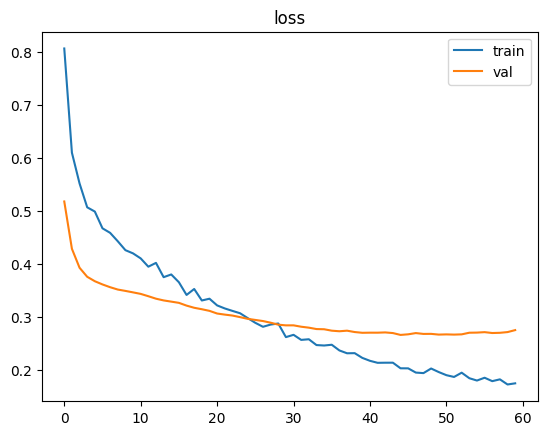

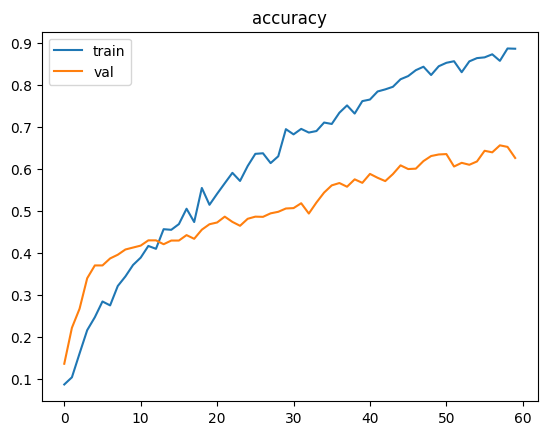

In [44]:
history = model.fit(train, n_epochs=150, batch_size=200, val_batch_size=60)
plot_metrics(history)

In [45]:
train_result = model.evaluate(train)
result = model.evaluate(test)

for measure, value in train_result.items():
    print(f'train_{measure}: {value}')

for measure, value in result.items():
    print(f'{measure}: {value}')

train_loss: 0.16384250061078506
train_accuracy: 0.9045904549685392
loss: 0.26238678802143445
accuracy: 0.6186046559702266


In [46]:
@torch.no_grad()
def get_mask_mini(shape, layer):
    convargs = ((shape[-3], shape[-2], shape[-1]), layer.kernel_size, layer.padding, layer.stride)
    out_tensor = torch.zeros(*shape, layer.out_channels)
    mask = torch.zeros(*shape, layer.out_channels)

    for n_neuron in range(layer.out_channels):
        for p, q, k in conviter(*convargs):
            w1_slice = layer.wave1[:, k[0], k[1], p[2], n_neuron]
            w2_slice = layer.wave2[:, p[0], k[1], k[2], n_neuron]
            w3_slice = layer.wave3[:, k[0], p[1], k[2], n_neuron]
            res = (w1_slice + w2_slice + w3_slice)
            # print( out_tensor[p[-3], p[-2], p[-1], n_neuron].shape, res.shape, w1_slice.shape, w2_slice.shape, w3_slice.shape )
            out_tensor[:, p[-3], p[-2], p[-1], n_neuron] += res
            mask[:, p[-3], p[-2], p[-1], n_neuron] += 1

    mask[mask == 0] = 1
    return out_tensor/mask

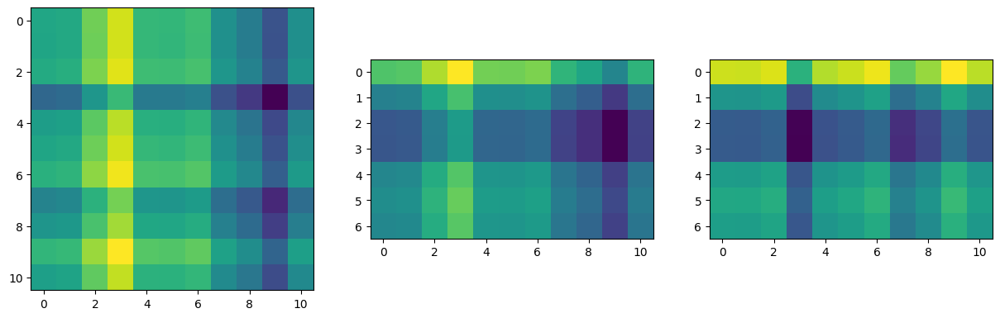

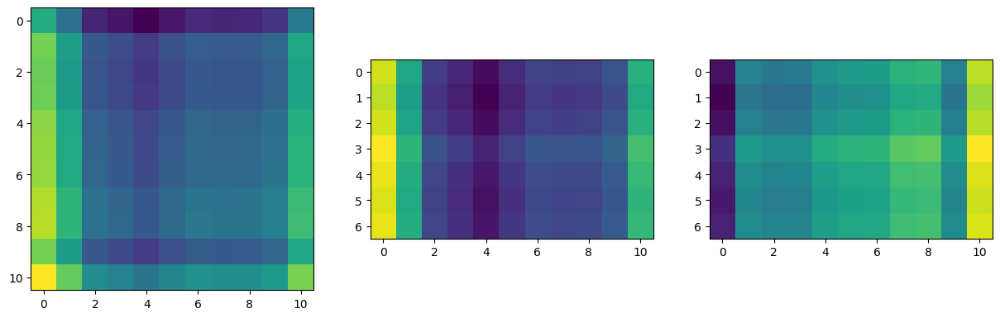

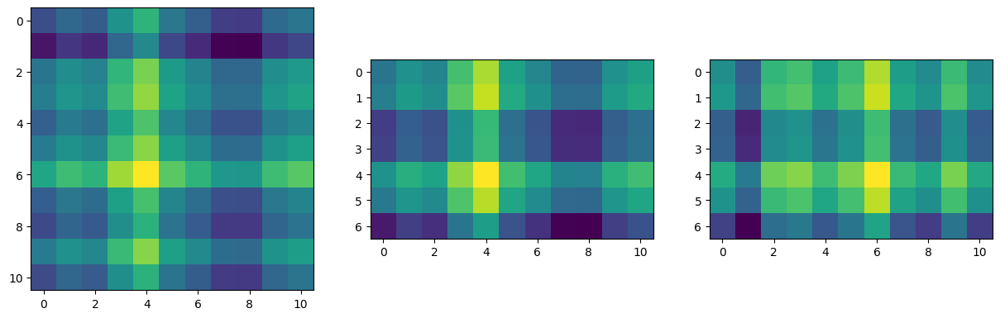

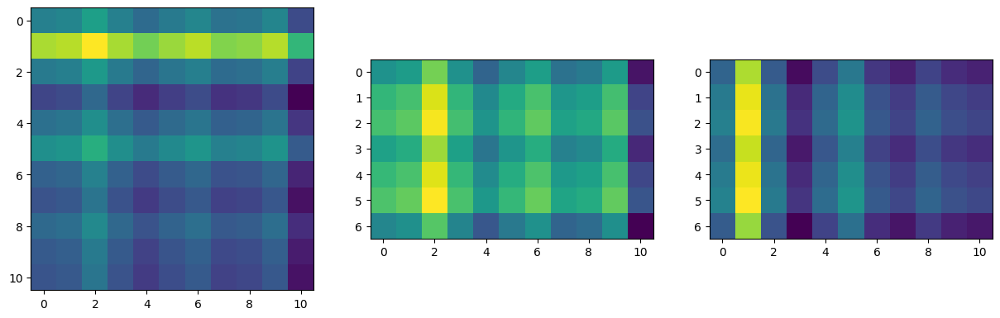

In [47]:
mask = model.rc(torch.ones(1, 1, *X[0].shape))
mask = mask.detach().numpy()
for i in range(mask.shape[1]):
    fig = plot_2d_projections(mask[0, i])
    plt.show()

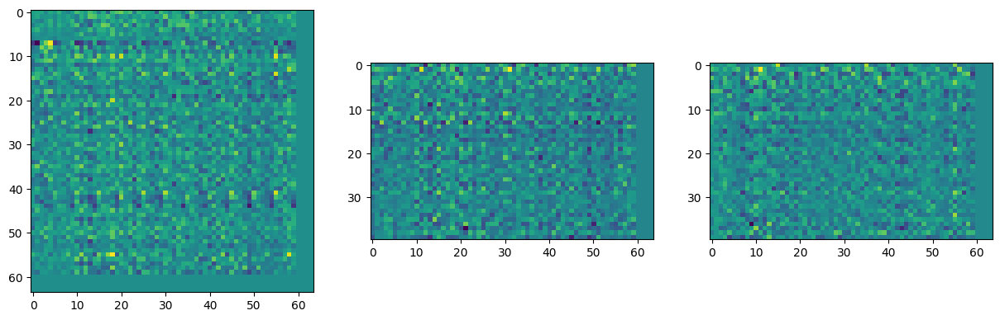

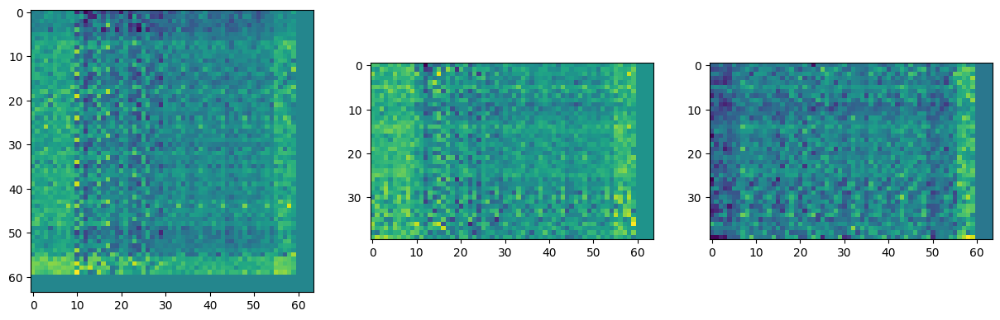

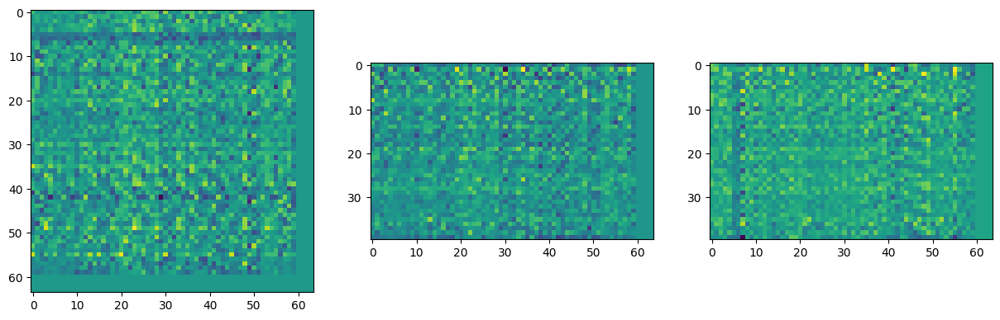

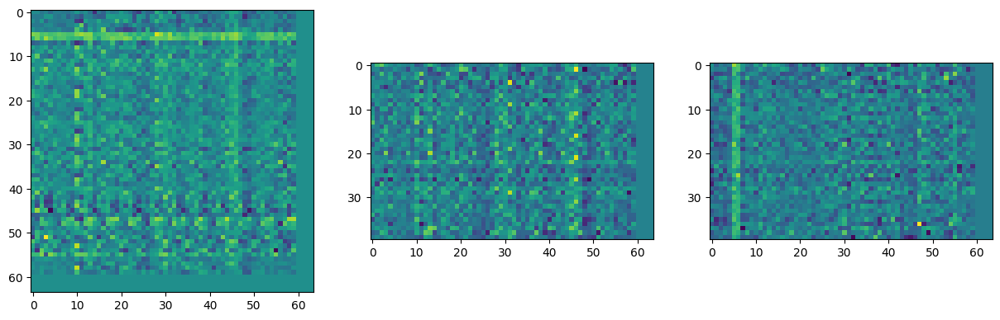

In [48]:
mask = torch.squeeze(get_mask_mini(
    next(iter(DataLoader(test)))[0].shape, model.rc
))
if mask.ndim > 3:
    for i in range(mask.shape[-1]):
        fig = plot_2d_projections(mask.detach()[:, :, :, i])
        plt.show()
else:
    fig = plot_2d_projections(mask.detach()[:, :, :])
    plt.show()

#### Res Conv Max Pool

In [308]:
import torch.nn.functional as F


def unravel_index(
    indices: torch.LongTensor,
    shape: tuple[int, ...],
) -> torch.LongTensor:
    r"""Converts flat indices into unraveled coordinates in a target shape.

    This is a `torch` implementation of `numpy.unravel_index`.

    Args:
        indices: A tensor of (flat) indices, (*, N).
        shape: The targeted shape, (D,).

    Returns:
        The unraveled coordinates, (*, N, D).
    """
    coord = []
    for dim in reversed(shape):
        coord.append(indices % dim)
        indices = indices // dim
    coord.reverse()
    return torch.stack(coord, dim=-1)


def get_maximum_indices(X):
    X_f = X.view(X.shape[0], -1)
    indices = torch.argmax(X_f, dim=1)
    return unravel_index(indices, X.shape[1:])


class PointSelection3D(nn.Module):
    def __init__(self, n: int):
        super().__init__()
        self.n = n

    def forward(self, x):
        out_tensor = torch.zeros(x.shape[0], x.shape[1], 2*self.n, 2*self.n, 2*self.n)
        # x = torch.abs(x)

        for n_channel in range(x.shape[1]):
            # pool each channel separately
            max_indices = get_maximum_indices(x[:, n_channel])

            for n_batch in range(x.shape[0]):

                indices = max_indices[n_batch]
                sides = (
                    (max(indices[0]-self.n, 0), min(indices[0]+self.n, x.shape[-3])),
                    (max(indices[1]-self.n, 0), min(indices[1]+self.n, x.shape[-2])),
                    (max(indices[2]-self.n, 0), min(indices[2]+self.n, x.shape[-1]))
                )
                paddings = (
                    max(0, self.n-indices[0]), max(0, indices[0]+self.n-x.shape[-3]),
                    max(0, self.n-indices[1]), max(0, indices[1]+self.n-x.shape[-2]),
                    max(0, self.n-indices[2]), max(0, indices[2]+self.n-x.shape[-1])
                )
                slice_ = x[n_batch, n_channel, sides[0][0]:sides[0][1], sides[1][0]:sides[1][1], sides[2][0]:sides[2][1]]
                slice_ = F.pad(slice_, paddings[::-1])
                out_tensor[n_batch, n_channel] = slice_
        return out_tensor

In [309]:
class CC2p(BaseModel):
    def __init__(
        self,
        in_channels,
        out_channels,
        input_size,
        kernel_size,
        maxpool_size,
        n_classes: int,
        stride=1,
        padding=0,
        dropout=None,
        batchnorm=False
    ):
        super().__init__()
        self.n_classes = n_classes
        self.rc = ResConv3D(in_channels, out_channels, input_size, kernel_size, stride, padding)
        self.dp = None if dropout is None else nn.Dropout3d(dropout)
        self.relu = nn.ReLU()#nn.Tanh()
        convargs = (input_size, kernel_size, padding, stride)
        self.convout_shape = compute_output_shape(*convargs)
        # self.bn = nn.BatchNorm3d(out_channels) if batchnorm else None
        self.maxpool = PointSelection3D(maxpool_size)
        self.maxpool_shape = (2*maxpool_size, 2*maxpool_size, 2*maxpool_size)
        self.num_features = out_channels*np.prod(self.maxpool_shape)
        self.bn = nn.BatchNorm1d(self.num_features) if batchnorm else None
        # self.linear0 = nn.Linear(self.num_features, self.num_features//2)
        self.linear = nn.Linear(self.num_features, self.n_classes)


    def forward(self, x: torch.Tensor):
        x = torch.unsqueeze(x, 1)

        x = self.rc(x)
        # x = self.relu(x)
        # x = torch.abs(x)

        if self.dp:
            x = self.dp(x)
        # if self.bn:
        #     x = self.bn(x)

        x = self.maxpool(x)
        # x = self.conv(x)

        x = torch.flatten(x, start_dim=1)
        if self.bn:
            x = self.bn(x)
        # x = self.linear0(x)
        # x = self.relu(x)
        x = self.linear(x)

        return x

In [310]:
X, Y = next(iter(DataLoader(train)))

In [311]:
config = dict( #accuracy: 0.78
    in_channels=1,
    out_channels=2,
    input_size=X[0].shape,
    kernel_size=(5, 5, 5),
    maxpool_size=2,
    n_classes=Y.shape[-1],
    stride=2,
    dropout=.4,
    batchnorm=True
)
config = dict( # accuracy: 0.79
    in_channels=1,
    out_channels=2,
    input_size=X[0].shape,
    kernel_size=(15, 15, 10),
    maxpool_size=2,
    n_classes=Y.shape[-1],
    stride=1,
    dropout=.4,
    batchnorm=True
)

config = dict( # accuracy: 0.79
    in_channels=1,
    out_channels=3,
    input_size=X[0].shape,
    kernel_size=(15, 15, 10),
    maxpool_size=2,
    n_classes=Y.shape[-1],
    stride=1,
    dropout=.4,
    batchnorm=True
)

config = dict( # accuracy: 0.83; relu: 0.78; tanh: 0.84
    in_channels=1,
    out_channels=5,
    input_size=X[0].shape,
    kernel_size=(15, 15, 10),
    maxpool_size=2,
    n_classes=Y.shape[-1],
    stride=1,
    dropout=.4,
    batchnorm=True
)

# config = dict( # accuracy: 0.82
#     in_channels=1,
#     out_channels=5,
#     input_size=X[0].shape,
#     kernel_size=(15, 15, 10),
#     maxpool_size=2,
#     n_classes=Y.shape[-1],
#     stride=1,
#     dropout=.4,
#     batchnorm=False
# )

# config = dict( # accuracy: 0.71
#     in_channels=1,
#     out_channels=1,
#     input_size=X[0].shape,
#     kernel_size=(15, 15, 10),
#     maxpool_size=1,
#     n_classes=Y.shape[-1],
#     stride=1,
#     dropout=.4,
#     batchnorm=True
# )

config = dict( # accuracy: 0.83; relu: 0.78; tanh: 0.84
    in_channels=1,
    out_channels=5,
    input_size=X[0].shape,
    kernel_size=(15, 15, 10),
    maxpool_size=2,
    n_classes=Y.shape[-1],
    stride=1,
    dropout=.4,
    batchnorm=True
)

In [312]:
model = CC2p(
    **config
)

optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3)
loss = torch.nn.BCEWithLogitsLoss()
metric = accuracy

model.compile(
    optimizer,
    loss,
    metric,
    callbacks=[
        PrintingCallback(),
        L2Reg(
            [
                'rc.wave1', 'rc.wave2', 'rc.wave3', 'linear.weight'
            ],
            0.01
        ),
        EarlyStopping(monitor='loss_val', restore_best_weights=True, patience=15)
    ]
)

In [313]:
model.state_dict().keys()

odict_keys(['rc.wave1', 'rc.wave2', 'rc.wave3', 'rc.bias', 'bn.weight', 'bn.bias', 'bn.running_mean', 'bn.running_var', 'bn.num_batches_tracked', 'linear.weight', 'linear.bias'])

In [314]:
model.convout_shape, model.maxpool_shape, model.num_features

((26, 5, 5), (4, 4, 4), 320)

In [315]:
if hasattr(sys.stdout, 'file'):
    sys.stdout = sys.stdout.file

Epoch 0:  loss_train:  0.7461   |    accuracy_train:  0.1602   |    loss_val:  0.7046   |    accuracy_val:  0.3431
Epoch 1:  loss_train:  0.7049   |    accuracy_train:  0.3914   |    loss_val:  0.7055   |    accuracy_val:  0.3852
Epoch 2:  loss_train:  0.6911   |    accuracy_train:  0.4439   |    loss_val:  0.6989   |    accuracy_val:  0.3810
Epoch 3:  loss_train:  0.6810   |    accuracy_train:  0.4954   |    loss_val:  0.6867   |    accuracy_val:  0.4440
Epoch 4:  loss_train:  0.6674   |    accuracy_train:  0.5537   |    loss_val:  0.6767   |    accuracy_val:  0.4759
Epoch 5:  loss_train:  0.6569   |    accuracy_train:  0.5604   |    loss_val:  0.6624   |    accuracy_val:  0.4806
Epoch 6:  loss_train:  0.6445   |    accuracy_train:  0.5786   |    loss_val:  0.6495   |    accuracy_val:  0.5051
Epoch 7:  loss_train:  0.6282   |    accuracy_train:  0.6067   |    loss_val:  0.6361   |    accuracy_val:  0.5315
Epoch 8:  loss_train:  0.6104   |    accuracy_train:  0.6374   |    loss_val:  0

[<Figure size 640x480 with 1 Axes>, <Figure size 640x480 with 1 Axes>]

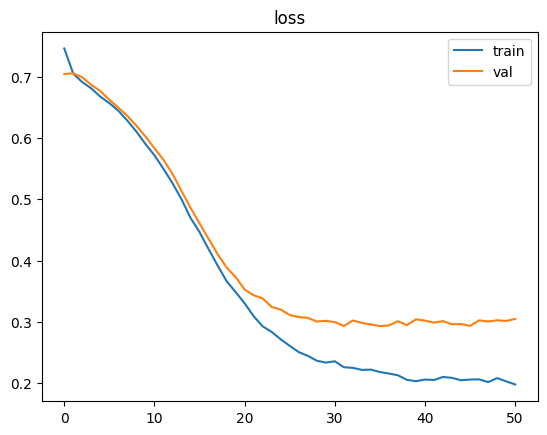

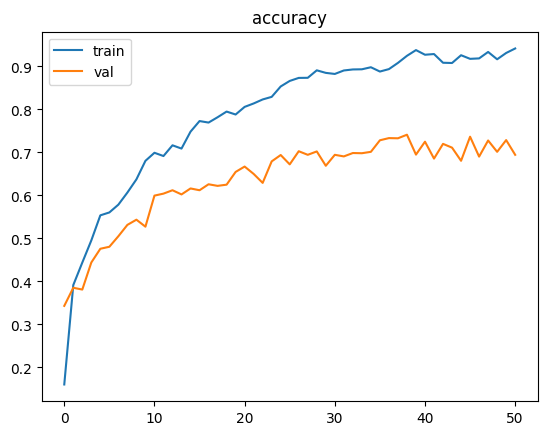

In [316]:
history = model.fit(train, n_epochs=150, batch_size=200, val_batch_size=60)
plot_metrics(history)

In [317]:
train_result = model.evaluate(train)
result = model.evaluate(test)

for measure, value in train_result.items():
    print(f'train_{measure}: {value}')

for measure, value in result.items():
    print(f'{measure}: {value}')

train_loss: 0.2113654979250648
train_accuracy: 0.9324932586063038
loss: 0.288668616251512
accuracy: 0.7014799226414073


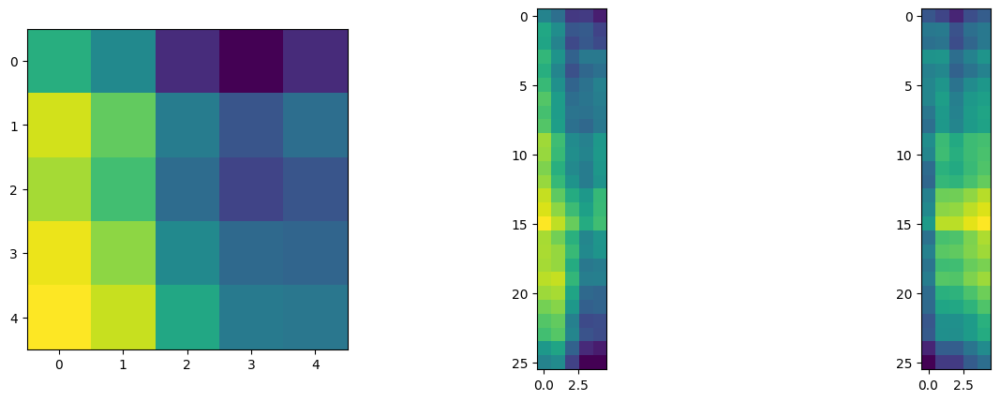

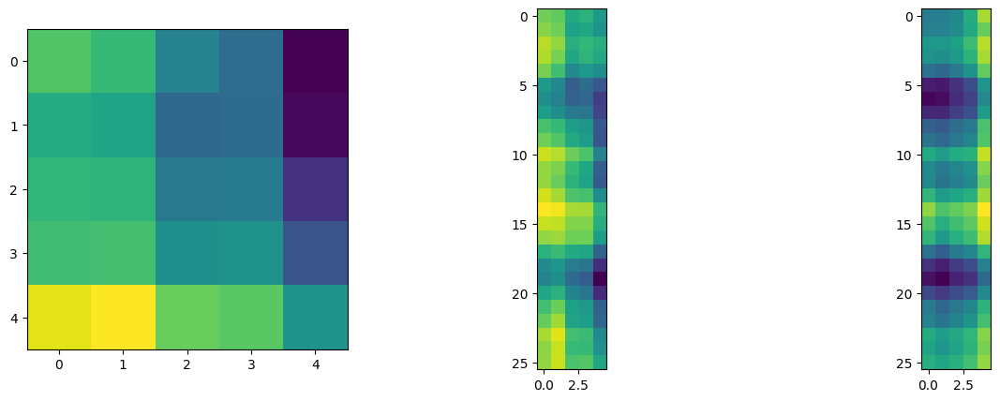

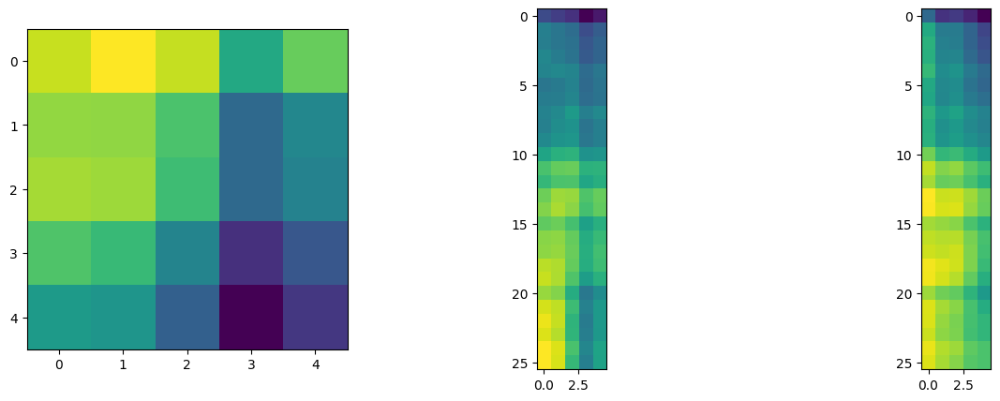

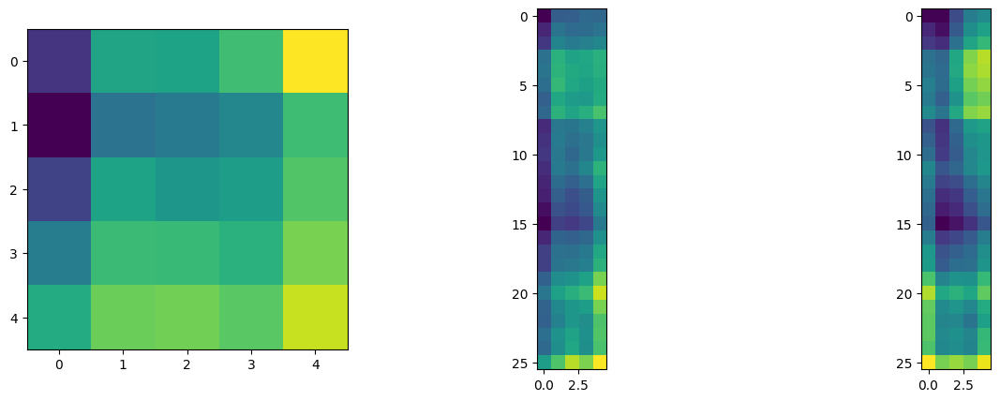

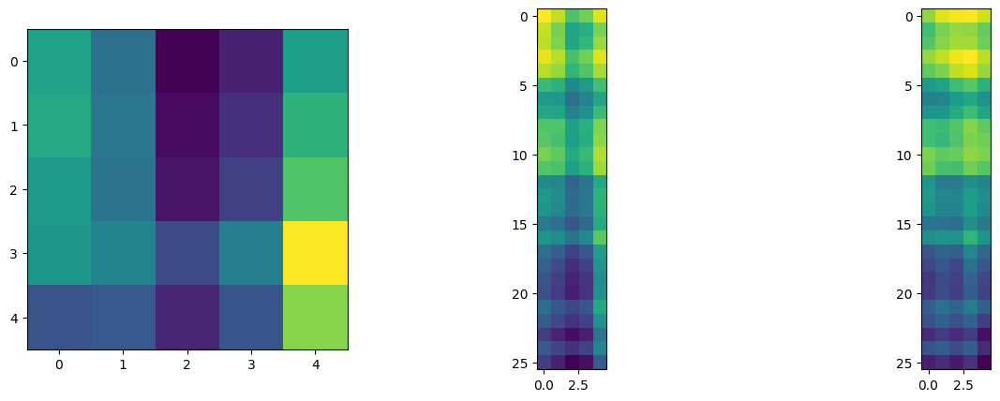

In [318]:
mask = model.rc(torch.ones(1, 1, *X[0].shape))
mask = mask.detach().numpy()
for i in range(mask.shape[1]):
    fig = plot_2d_projections(mask[0, i])
    plt.show()

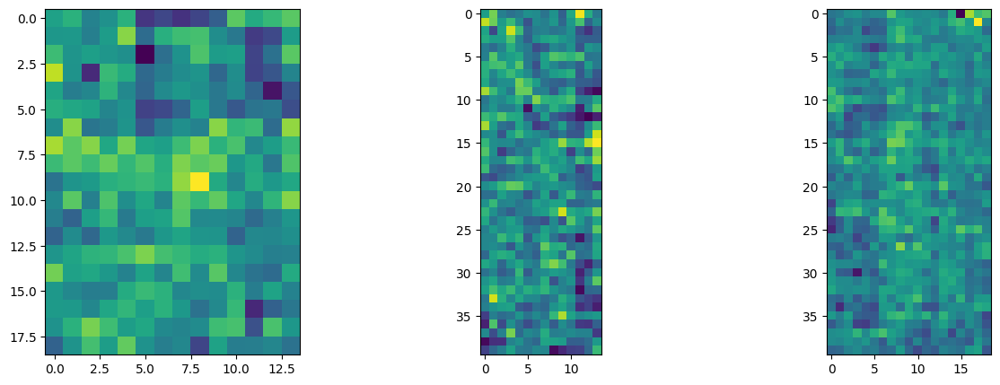

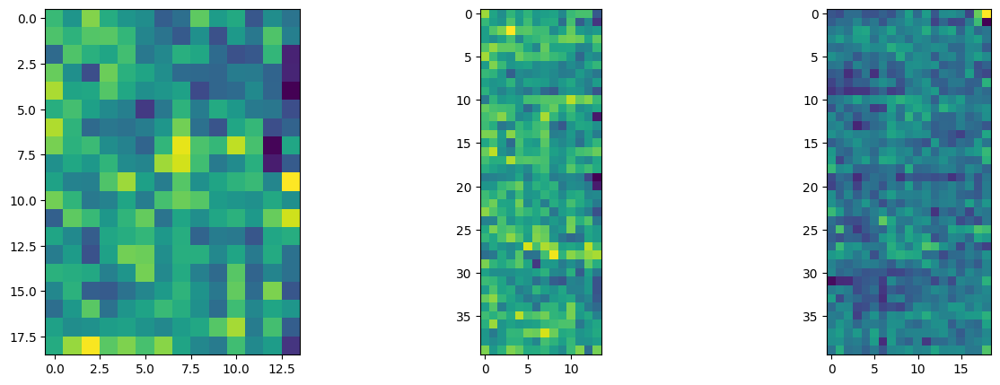

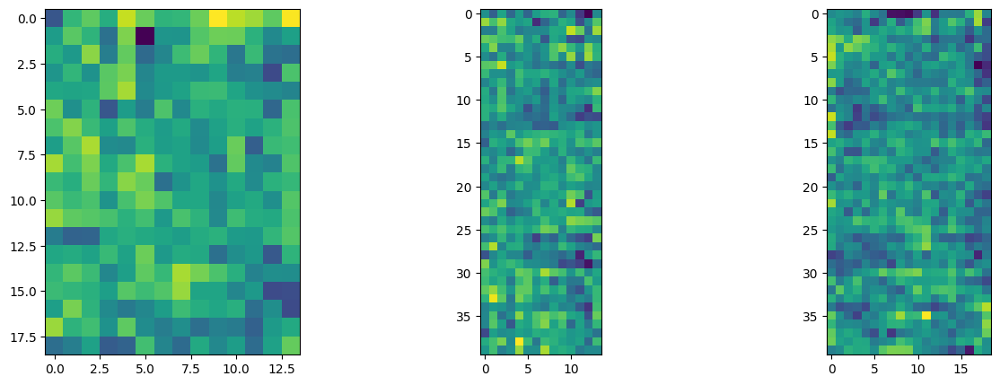

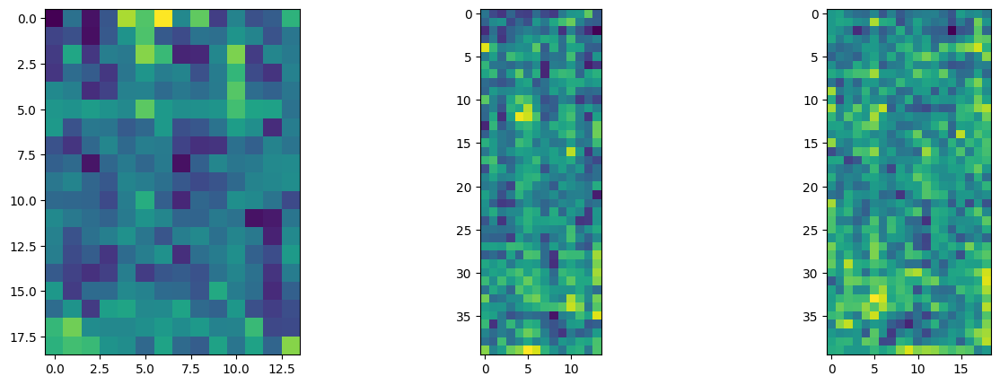

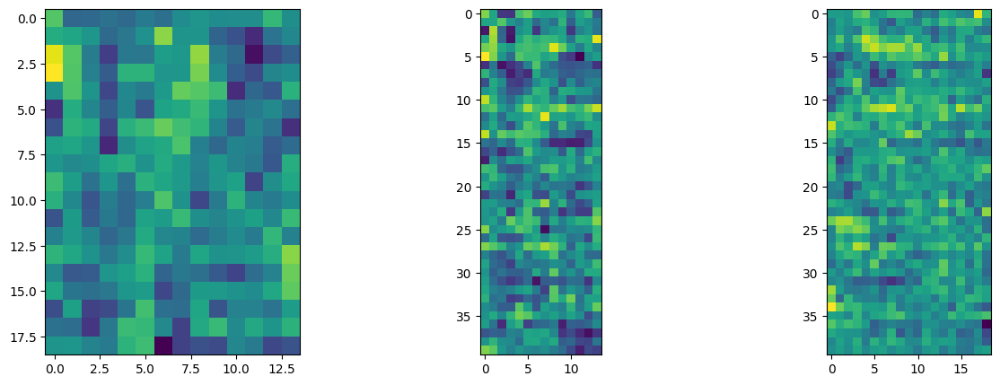

In [319]:
mask = torch.squeeze(get_mask(
    next(iter(DataLoader(test)))[0].shape, model.rc
))
if mask.ndim > 3:
    for i in range(mask.shape[-1]):
        fig = plot_2d_projections(mask.detach()[:, :, :, i])
        plt.show()
else:
    fig = plot_2d_projections(mask.detach()[:, :, :])
    plt.show()

#### Res Conc Max Pool

In [5]:
X, Y = next(iter(DataLoader(train, 2)))

In [6]:
config = dict( #accuracy: 0.78
    in_channels=1,
    out_channels=2,
    input_size=X[0].shape,
    kernel_size=(5, 5, 5),
    maxpool_size=2,
    n_classes=Y.shape[-1],
    stride=2,
    dropout=.4,
    batchnorm=True
)
config = dict( # accuracy: 0.79
    in_channels=1,
    out_channels=2,
    input_size=X[0].shape,
    kernel_size=(15, 15, 10),
    maxpool_size=2,
    n_classes=Y.shape[-1],
    stride=1,
    dropout=.4,
    batchnorm=True
)

config = dict( # accuracy: 0.79
    in_channels=1,
    out_channels=3,
    input_size=X[0].shape,
    kernel_size=(15, 15, 10),
    maxpool_size=2,
    n_classes=Y.shape[-1],
    stride=1,
    dropout=.4,
    batchnorm=True
)

# config = dict( # accuracy: 0.83; relu: 0.78; tanh: 0.84
#     in_channels=1,
#     out_channels=5,
#     input_size=X[0].shape,
#     kernel_size=(15, 15, 10),
#     maxpool_size=2,
#     n_classes=Y.shape[-1],
#     stride=1,
#     dropout=.4,
#     batchnorm=True
# )

config = dict( # accuracy: 0.82
    in_channels=1,
    out_channels=2,
    input_size=X[0].shape,
    kernel_size=(15, 15, 10),
    maxpool_size=2,
    n_classes=Y.shape[-1],
    stride=1,
    dropout=.4,
    batchnorm=False
)

# config = dict( # accuracy: 0.71
#     in_channels=1,
#     out_channels=1,
#     input_size=X[0].shape,
#     kernel_size=(15, 15, 10),
#     maxpool_size=1,
#     n_classes=Y.shape[-1],
#     stride=1,
#     dropout=.4,
#     batchnorm=True
# )

In [7]:
class CC3p(BaseModel):
    def __init__(
        self,
        in_channels,
        out_channels,
        input_size,
        kernel_size,
        maxpool_size,
        n_classes: int,
        stride=1,
        padding=0,
        dropout=None,
        batchnorm=False
    ):
        super().__init__()
        self.n_classes = n_classes
        self.rc = ResConc3D(in_channels, out_channels, input_size, kernel_size, stride, padding)
        self.dp = None if dropout is None else nn.Dropout(dropout)
        self.relu = nn.ReLU()
        convargs = (input_size, kernel_size, padding, stride)
        self.convout_shape = input_size#compute_output_shape(*convargs)
        self.bn = nn.BatchNorm3d(out_channels) if batchnorm else None
        self.maxpool = PointSelection3D(maxpool_size)
        self.maxpool_shape = (2*maxpool_size, 2*maxpool_size, 2*maxpool_size)
        self.num_features = out_channels*np.prod(self.maxpool_shape)
        self.linear = nn.Linear(self.num_features, self.n_classes)


    def forward(self, x: torch.Tensor):
        x = torch.unsqueeze(x, 1)
        x = self.rc(x)
        if self.dp:
            x = self.dp(x)
        if self.bn:
            x = self.bn(x)
        # x = self.relu(x)
        x = self.maxpool(x)
        # x = self.conv(x)

        x = torch.flatten(x, start_dim=1)
        x = self.linear(x)

        return x

In [14]:
model = CC3p(
    **config
)

optimizer = torch.optim.Adam#W(model.parameters(), lr=1e-3)
loss = torch.nn.BCEWithLogitsLoss()
metric = accuracy

model.compile(
    optimizer,
    loss,
    metric,
    callbacks=[
        PrintingCallback(),
        L2Reg(
            [
                'rc.wave1', 'rc.wave2', 'rc.wave3'
            ],
            0.01
        ),
        EarlyStopping(monitor='loss_val', restore_best_weights=True, patience=15)
    ]
)

In [15]:
model.convout_shape, model.maxpool_shape, model.num_features

(torch.Size([40, 19, 14]), (4, 4, 4), 128)

In [16]:
if hasattr(sys.stdout, 'file'):
    sys.stdout = sys.stdout.file

Epoch 0:  loss_train:  0.7077   |    accuracy_train:  0.3719   |    loss_val:  0.7054   |    accuracy_val:  0.4273
Epoch 1:  loss_train:  0.7044   |    accuracy_train:  0.3868   |    loss_val:  0.7019   |    accuracy_val:  0.4273
Epoch 2:  loss_train:  0.7000   |    accuracy_train:  0.3882   |    loss_val:  0.6970   |    accuracy_val:  0.4273
Epoch 3:  loss_train:  0.6938   |    accuracy_train:  0.3774   |    loss_val:  0.6903   |    accuracy_val:  0.4315
Epoch 4:  loss_train:  0.6862   |    accuracy_train:  0.3744   |    loss_val:  0.6818   |    accuracy_val:  0.4315
Epoch 5:  loss_train:  0.6760   |    accuracy_train:  0.3778   |    loss_val:  0.6711   |    accuracy_val:  0.4356
Epoch 6:  loss_train:  0.6639   |    accuracy_train:  0.3880   |    loss_val:  0.6581   |    accuracy_val:  0.4315
Epoch 7:  loss_train:  0.6495   |    accuracy_train:  0.3852   |    loss_val:  0.6428   |    accuracy_val:  0.4310
Epoch 8:  loss_train:  0.6323   |    accuracy_train:  0.3607   |    loss_val:  0

[<Figure size 640x480 with 1 Axes>, <Figure size 640x480 with 1 Axes>]

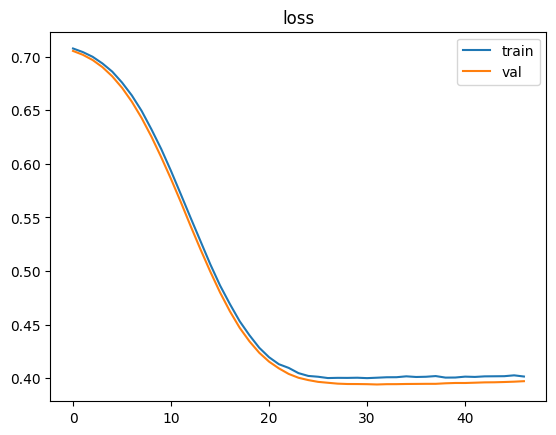

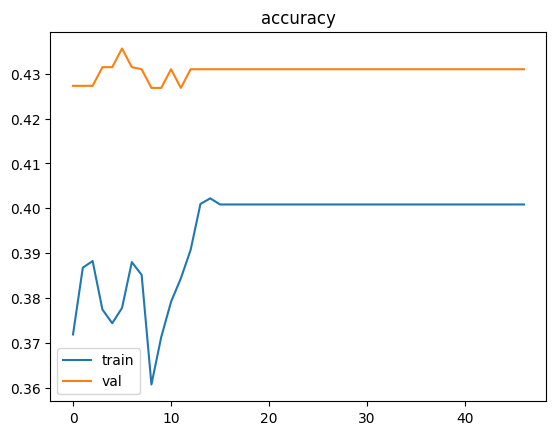

In [17]:
history = model.fit(train, n_epochs=150, batch_size=200, val_batch_size=60)
plot_metrics(history)

In [18]:
train_result = model.evaluate(train)
result = model.evaluate(test)

for measure, value in train_result.items():
    print(f'train_{measure}: {value}')

for measure, value in result.items():
    print(f'{measure}: {value}')

train_loss: 0.3981107012792067
train_accuracy: 0.41069821606982837
loss: 0.40186653353951196
accuracy: 0.3957716714252125


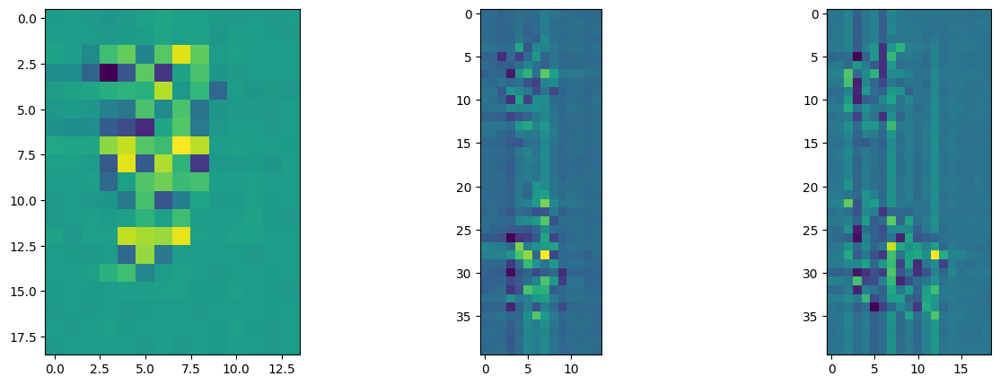

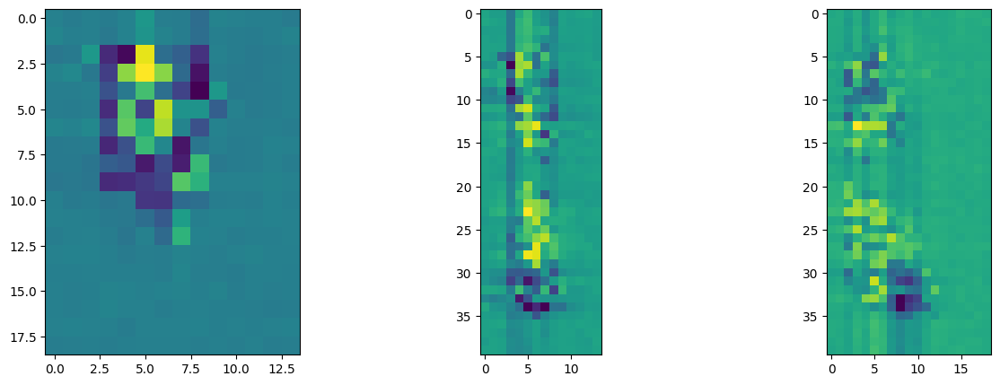

In [19]:
mask = model.rc(torch.ones(1, 1, *X[0].shape))
mask = mask.detach().numpy()
for i in range(mask.shape[1]):
    fig = plot_2d_projections(mask[0, i])
    plt.show()

#### ResConcMasked

In [225]:
class CC3mask(BaseModel):
    def __init__(
        self,
        in_channels,
        out_channels,
        input_size,
        kernel_size,
        mask,
        n_classes: int,
        stride=1,
        padding=0,
        dropout=None,
        batchnorm=False
    ):
        super().__init__()
        self.n_classes = n_classes
        self.rc = ResConc3D(in_channels, out_channels, input_size, kernel_size, stride, padding)
        self.dp = None if dropout is None else nn.Dropout(dropout)
        self.relu = nn.ReLU()
        convargs = (input_size, kernel_size, padding, stride)
        self.convout_shape = input_size#compute_output_shape(*convargs)
        self.bn = nn.BatchNorm3d(out_channels) if batchnorm else None
        self.mask = mask if isinstance(mask, torch.Tensor) else torch.tensor(mask)
        mask_flatten = torch.flatten(self.mask)
        self.mask_indices = torch.where(mask_flatten == 1)[0]
        self.num_features = out_channels*len(self.mask_indices)
        self.linear = nn.Linear(self.num_features, self.n_classes)


    def forward(self, x: torch.Tensor):
        x = torch.unsqueeze(x, 1)
        x = self.rc(x)
        if self.dp:
            x = self.dp(x)
        if self.bn:
            x = self.bn(x)

        x = torch.flatten(x, start_dim=2)
        x = x[:, :, self.mask_indices]
        x = torch.flatten(x, start_dim=1)
        x = self.linear(x)

        return x

In [226]:
config = dict( # accuracy: 0.82
    in_channels=1,
    out_channels=2,
    input_size=X[0].shape,
    kernel_size=(15, 15, 10),
    n_classes=Y.shape[-1],
    stride=1,
    dropout=.4,
    batchnorm=True,
    mask=mask[:, 15:-30, 25:-25]
)


In [227]:
model = CC3mask(
    **config
)

optimizer = torch.optim.Adam#W(model.parameters(), lr=1e-3)
loss = torch.nn.BCEWithLogitsLoss()
metric = accuracy

model.compile(
    optimizer,
    loss,
    metric,
    callbacks=[
        PrintingCallback(),
        L2Reg(
            [
                'rc.wave1', 'rc.wave2', 'rc.wave3'
            ],
            0.01
        ),
        EarlyStopping(monitor='loss_val', restore_best_weights=True, patience=15)
    ]
)

In [228]:
model.convout_shape, model.num_features

(torch.Size([40, 19, 14]), 1350)

In [229]:
model(X)

tensor([[-1.0021,  0.1992,  0.5707, -0.6543, -0.7114,  0.6547, -0.2934,  0.0401,
          0.4019],
        [ 0.6108,  0.0706, -0.5159, -0.5808, -0.0759,  0.2668,  1.0714,  0.0350,
          0.1864]], grad_fn=<AddmmBackward0>)

In [230]:
if hasattr(sys.stdout, 'file'):
    sys.stdout = sys.stdout.file

Epoch 0:  loss_train:  0.8760   |    accuracy_train:  0.2790   |    loss_val:  0.7107   |    accuracy_val:  0.3773
Epoch 1:  loss_train:  0.7709   |    accuracy_train:  0.4206   |    loss_val:  0.7129   |    accuracy_val:  0.4042
Epoch 2:  loss_train:  0.7198   |    accuracy_train:  0.4648   |    loss_val:  0.7140   |    accuracy_val:  0.4958
Epoch 3:  loss_train:  0.6939   |    accuracy_train:  0.5116   |    loss_val:  0.7138   |    accuracy_val:  0.5727
Epoch 4:  loss_train:  0.6816   |    accuracy_train:  0.5548   |    loss_val:  0.7105   |    accuracy_val:  0.6051
Epoch 5:  loss_train:  0.6667   |    accuracy_train:  0.5812   |    loss_val:  0.7027   |    accuracy_val:  0.6431
Epoch 6:  loss_train:  0.6605   |    accuracy_train:  0.5897   |    loss_val:  0.6910   |    accuracy_val:  0.6769
Epoch 7:  loss_train:  0.6439   |    accuracy_train:  0.6186   |    loss_val:  0.6749   |    accuracy_val:  0.6773
Epoch 8:  loss_train:  0.6163   |    accuracy_train:  0.6412   |    loss_val:  0

[<Figure size 640x480 with 1 Axes>, <Figure size 640x480 with 1 Axes>]

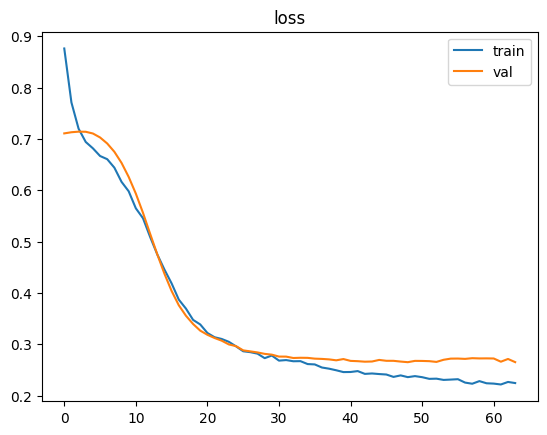

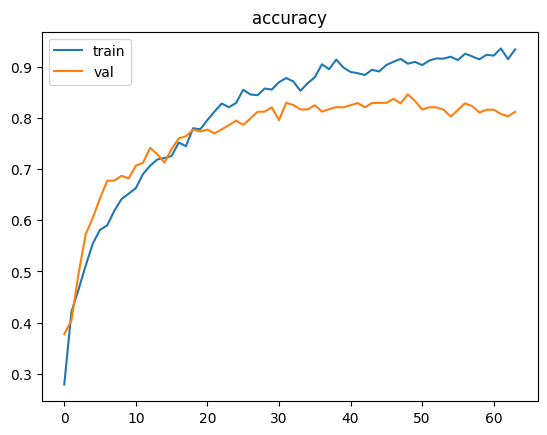

In [231]:
history = model.fit(train, n_epochs=150, batch_size=200, val_batch_size=60)
plot_metrics(history)

In [232]:
train_result = model.evaluate(train)
result = model.evaluate(test)

for measure, value in train_result.items():
    print(f'train_{measure}: {value}')

for measure, value in result.items():
    print(f'{measure}: {value}')

train_loss: 0.2078857123851776
train_accuracy: 0.9504950642585754
loss: 0.277545303106308
accuracy: 0.8050739981911399


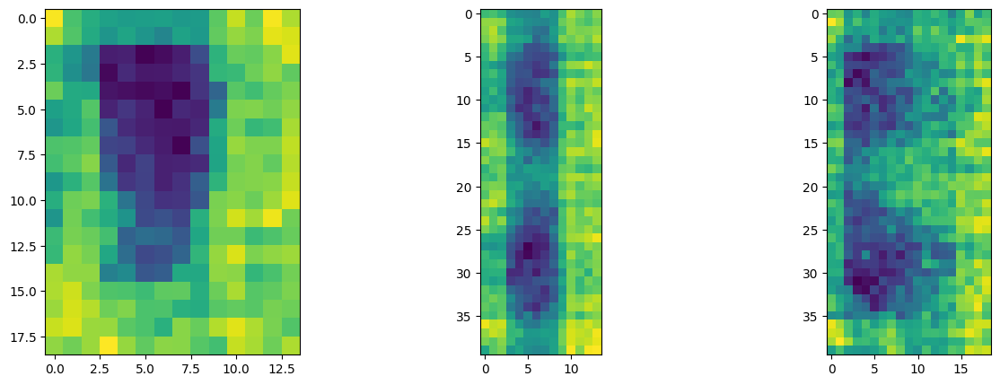

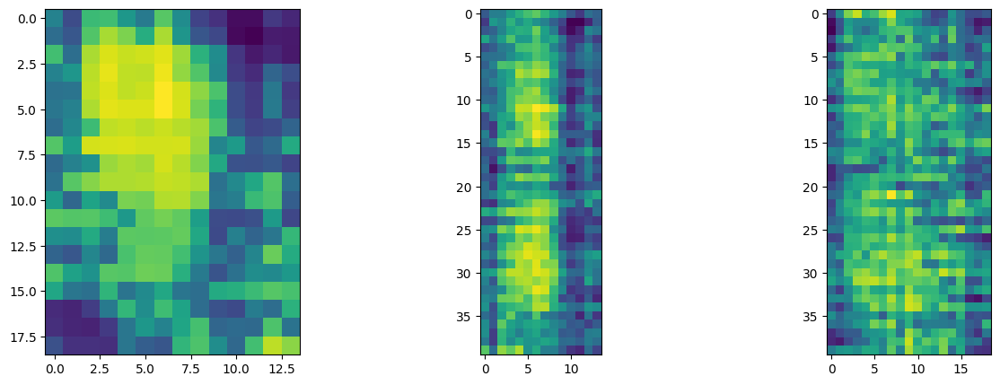

In [233]:
mask = model.rc(torch.ones(1, 1, *X[0].shape))
mask = mask.detach().numpy()
for i in range(mask.shape[1]):
    fig = plot_2d_projections(mask[0, i])
    plt.show()

#### MultiResConv

In [178]:
class CC2d(BaseModel):
    def __init__(
        self,
        in_channels,
        out_channels,
        out_channels2,
        input_size,
        kernel_size,
        kernel_size2,
        n_classes: int,
        stride=1,
        stride2=1,
        padding=0,
        padding2=0,
        dropout=None,
        dropout2=None,
        batchnorm=False,
        batchnorm2=False
    ):
        super().__init__()
        self.n_classes = n_classes
        self.rc = ResConv3D(in_channels, out_channels, input_size, kernel_size, stride, padding)
        self.dp = None if dropout is None else nn.Dropout3d(dropout)
        self.dp2 = None if dropout2 is None else nn.Dropout3d(dropout2)

        convargs = (input_size, kernel_size, padding, stride)
        self.convout_shape = compute_output_shape(*convargs)

        self.bn = nn.BatchNorm3d(out_channels) if batchnorm else None
        self.bn2 = nn.BatchNorm3d(out_channels2) if batchnorm2 else None
        self.rc2 = ResConv3D(out_channels, out_channels2, self.convout_shape, kernel_size2, stride2, padding2)

        convargs = (self.convout_shape, kernel_size2, padding2, stride2)
        self.convout_shape2 = compute_output_shape(*convargs)

        self.num_features = out_channels2*np.prod(self.convout_shape2)
        self.linear = nn.Linear(self.num_features, self.n_classes)


    def forward(self, x: torch.Tensor):
        x = torch.unsqueeze(x, 1)

        x = self.rc(x)

        if self.dp:
            x = self.dp(x)
        if self.bn:
            x = self.bn(x)

        x = self.rc2(x)

        if self.dp2:
            x = self.dp2(x)
        if self.bn2:
            x = self.bn2(x)


        x = torch.flatten(x, start_dim=1)
        x = self.linear(x)

        return x

In [254]:
config = dict(
    in_channels=1,
    out_channels=3,
    out_channels2=5,
    input_size=X[0].shape,
    kernel_size=(20, 12, 10),
    kernel_size2=(10, 6, 4),
    n_classes=Y.shape[-1],
    stride=1,
    stride2=1,
    dropout=.4,
    batchnorm=True,
    dropout2=.2,
    batchnorm2=False
)

In [255]:
if hasattr(sys.stdout, 'file'):
    sys.stdout = sys.stdout.file

In [256]:
model = CC2d(
    **config
)

optimizer = torch.optim.Adam#W(model.parameters(), lr=1e-3)
loss = torch.nn.BCEWithLogitsLoss()
metric = accuracy

model.compile(
    optimizer,
    loss,
    metric,
    callbacks=[
        PrintingCallback(),
        L2Reg(
            [
                'rc.wave1', 'rc.wave2', 'rc.wave3',
                'rc2.wave1', 'rc2.wave2', 'rc2.wave3'
            ],
            0.01
        ),
        EarlyStopping(monitor='loss_val', restore_best_weights=True, patience=15)
    ]
)

In [257]:
model.convout_shape, model.convout_shape2, model.num_features

((21, 8, 5), (12, 3, 2), 360)

In [258]:
history = model.fit(train, n_epochs=150, batch_size=200, val_batch_size=60)
plot_metrics(history)

Epoch 0:  loss_train:  0.7446   |    accuracy_train:  0.2450   |    loss_val:  0.7234   |    accuracy_val:  0.4060
Epoch 1:  loss_train:  0.7182   |    accuracy_train:  0.4282   |    loss_val:  0.7099   |    accuracy_val:  0.4843
Epoch 2:  loss_train:  0.6970   |    accuracy_train:  0.4676   |    loss_val:  0.6814   |    accuracy_val:  0.5472
Epoch 3:  loss_train:  0.6822   |    accuracy_train:  0.5068   |    loss_val:  0.6715   |    accuracy_val:  0.5694
Epoch 4:  loss_train:  0.6474   |    accuracy_train:  0.5812   |    loss_val:  0.6410   |    accuracy_val:  0.6069
Epoch 5:  loss_train:  0.5956   |    accuracy_train:  0.5952   |    loss_val:  0.5935   |    accuracy_val:  0.6023
Epoch 6:  loss_train:  0.5469   |    accuracy_train:  0.6061   |    loss_val:  0.5143   |    accuracy_val:  0.6065
Epoch 7:  loss_train:  0.4803   |    accuracy_train:  0.5895   |    loss_val:  0.4310   |    accuracy_val:  0.5898
Epoch 8:  loss_train:  0.4321   |    accuracy_train:  0.5776   |    loss_val:  0

KeyboardInterrupt: 

In [ ]:
train_result = model.evaluate(train)
result = model.evaluate(test)

for measure, value in train_result.items():
    print(f'train_{measure}: {value}')

for measure, value in result.items():
    print(f'{measure}: {value}')

#### Stupid average

In [101]:
class CC2a(BaseModel):
    def __init__(
        self,
        in_channels,
        out_channels,
        input_size,
        kernel_size,
        n_classes: int,
        stride=1,
        padding=0,
        dropout=None,
        batchnorm=False
    ):
        super().__init__()
        self.n_classes = n_classes
        self.rc = ResConv3D(in_channels, out_channels, input_size, kernel_size, stride, padding)
        self.dp = None if dropout is None else nn.Dropout3d(dropout)
        self.relu = nn.ReLU()#nn.Tanh()
        convargs = (input_size, kernel_size, padding, stride)
        self.convout_shape = compute_output_shape(*convargs)
        # self.bn = nn.BatchNorm3d(out_channels) if batchnorm else None
        # self.maxpool = PointSelection3D(maxpool_size)
        # self.maxpool_shape = (2*maxpool_size, 2*maxpool_size, 2*maxpool_size)
        # self.num_features = out_channels*self.convout_shape[0]
        self.num_features = out_channels*(self.convout_shape[0] + self.convout_shape[1] + self.convout_shape[2])
        self.bn = nn.BatchNorm1d(self.num_features) if batchnorm else None
        self.linear0 = nn.Linear(self.num_features, self.num_features//2)
        # self.linear = nn.Linear(self.num_features//2, self.n_classes)
        self.linear = nn.Linear(self.num_features, self.n_classes)


    def forward(self, x: torch.Tensor):
        x = torch.unsqueeze(x, 1)

        x = self.rc(x)
        # x = self.relu(x)
        # x = torch.abs(x)

        if self.dp:
            x = self.dp(x)
        # if self.bn:
        #     x = self.bn(x)

        # x = x.mean((3, 4))
        # x = x.max(4).values.max(3).values
        x = torch.cat([x.max(4).values.max(3).values, x.max(4).values.max(2).values, x.max(3).values.max(2).values], 2)
        x = torch.flatten(x, start_dim=1)

        if self.bn:
            x = self.bn(x)
        # x = self.linear0(x)
        # x = self.relu(x)
        x = self.linear(x)

        return x

In [102]:
X, Y = next(iter(DataLoader(train, 20)))

In [114]:
config = dict(
    in_channels=1,
    out_channels=5,
    input_size=X[0].shape,
    kernel_size=(15, 15, 10),
    n_classes=Y.shape[-1],
    stride=1,
    dropout=.4,
    batchnorm=True
)

In [115]:
model = CC2a(
    **config
)

optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3)
loss = torch.nn.BCEWithLogitsLoss()
metric = accuracy

model.compile(
    optimizer,
    loss,
    metric,
    callbacks=[
        PrintingCallback(),
        L2Reg(
            [
                'rc.wave1', 'rc.wave2', 'rc.wave3'
            ],
            0.01
        ),
        EarlyStopping(monitor='loss_val', restore_best_weights=True, patience=15)
    ]
)

In [116]:
model.convout_shape, model.num_features

((26, 5, 5), 180)

In [117]:
model(X)

tensor([[ 4.6374e-01,  1.6238e-01,  1.8441e-01,  5.5127e-01,  1.7875e-01,
         -4.7040e-01, -1.0602e+00,  1.4754e-01, -5.2694e-01],
        [-3.4290e-03, -9.8837e-01,  4.3338e-01,  1.1829e+00, -9.1790e-01,
         -1.8801e-01, -1.5202e+00,  2.3592e-01, -1.8253e-01],
        [ 1.1145e-01,  1.1324e+00, -1.2832e+00,  8.5056e-01, -5.1529e-01,
          2.4034e-01,  1.8614e-01,  1.3186e+00,  3.7632e-01],
        [ 5.1196e-02, -1.9475e-01,  3.6525e-01,  4.2334e-01,  3.1909e-01,
          5.6260e-02, -5.2720e-01, -7.1656e-01, -1.0260e+00],
        [ 2.1297e-01, -9.9119e-01, -2.2292e-01, -4.7669e-01,  4.6854e-01,
          4.7152e-01,  2.3530e-01, -4.6149e-01, -3.2649e-01],
        [-2.2255e-01, -5.0057e-01,  8.1867e-01,  5.9278e-01, -6.9001e-01,
         -2.0680e-01, -1.0474e+00, -1.6240e-01, -3.6192e-02],
        [-4.7720e-01, -9.6392e-04,  5.2376e-01, -3.4074e-01,  3.9848e-01,
         -3.2568e-01, -3.0350e-01,  2.5177e-01, -5.9163e-01],
        [ 2.4203e-01,  5.2430e-01, -8.8874e-01, 

In [118]:
if hasattr(sys.stdout, 'file'):
    sys.stdout = sys.stdout.file

Epoch 0:  loss_train:  0.7532   |    accuracy_train:  0.1179   |    loss_val:  0.7659   |    accuracy_val:  0.0593
Epoch 1:  loss_train:  0.7312   |    accuracy_train:  0.1420   |    loss_val:  0.7297   |    accuracy_val:  0.0593
Epoch 2:  loss_train:  0.7225   |    accuracy_train:  0.1946   |    loss_val:  0.7328   |    accuracy_val:  0.4074
Epoch 3:  loss_train:  0.7191   |    accuracy_train:  0.1602   |    loss_val:  0.7218   |    accuracy_val:  0.3606
Epoch 4:  loss_train:  0.7152   |    accuracy_train:  0.1758   |    loss_val:  0.7105   |    accuracy_val:  0.4630
Epoch 5:  loss_train:  0.7102   |    accuracy_train:  0.1960   |    loss_val:  0.7050   |    accuracy_val:  0.4630
Epoch 6:  loss_train:  0.7060   |    accuracy_train:  0.1524   |    loss_val:  0.6998   |    accuracy_val:  0.4630
Epoch 7:  loss_train:  0.6995   |    accuracy_train:  0.2128   |    loss_val:  0.6945   |    accuracy_val:  0.4630
Epoch 8:  loss_train:  0.6917   |    accuracy_train:  0.2507   |    loss_val:  0

[<Figure size 640x480 with 1 Axes>, <Figure size 640x480 with 1 Axes>]

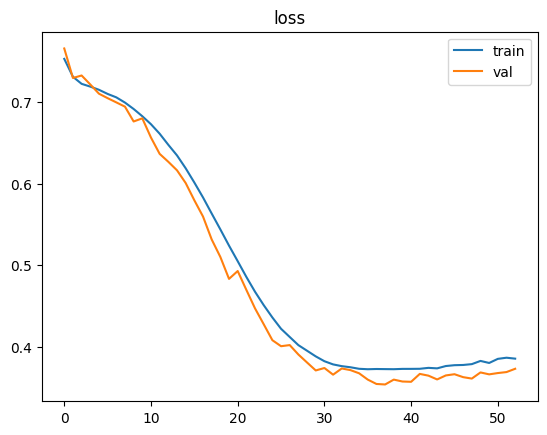

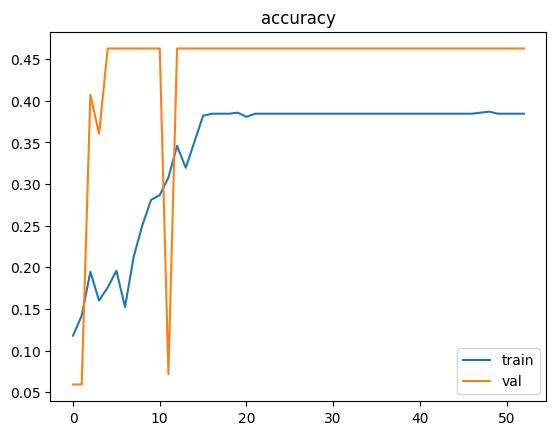

In [119]:
history = model.fit(train, n_epochs=150, batch_size=200, val_batch_size=60)
plot_metrics(history)

In [120]:
train_result = model.evaluate(train)
result = model.evaluate(test)

for measure, value in train_result.items():
    print(f'train_{measure}: {value}')

for measure, value in result.items():
    print(f'{measure}: {value}')

train_loss: 0.36823606491088867
train_accuracy: 0.39321074973453174
loss: 0.3667842745780945
accuracy: 0.40845666554841126


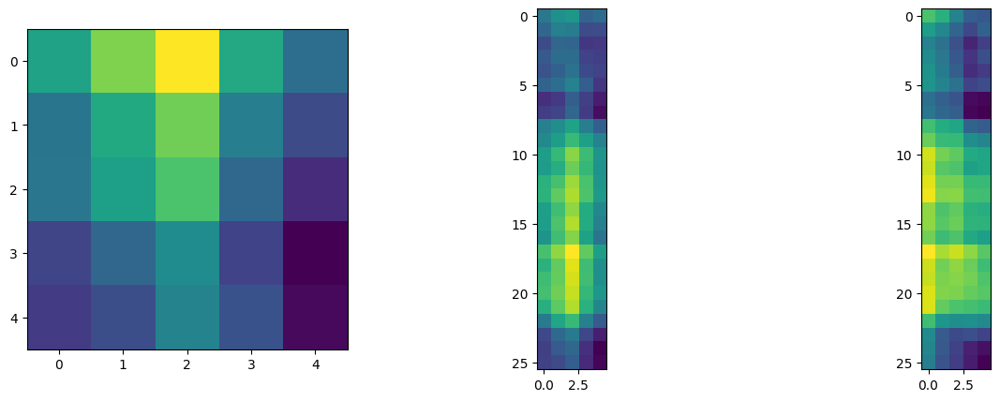

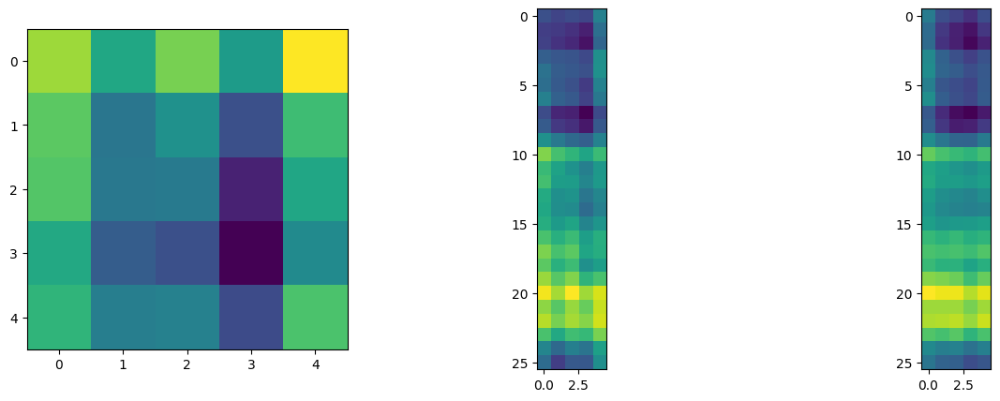

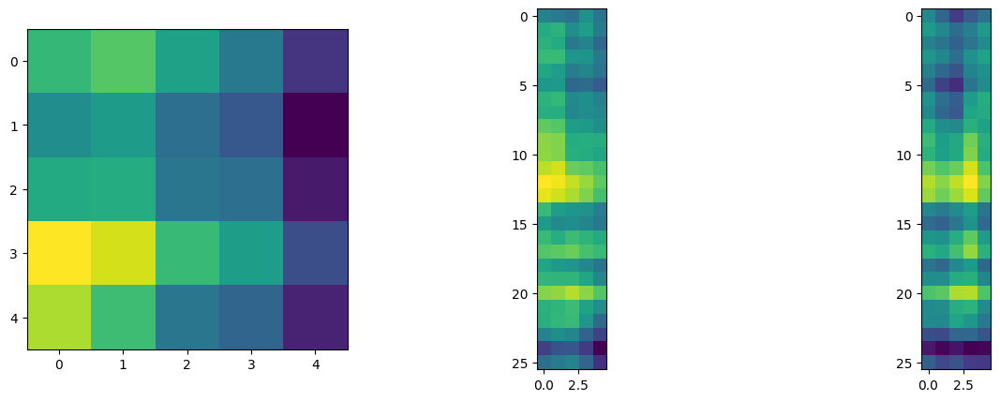

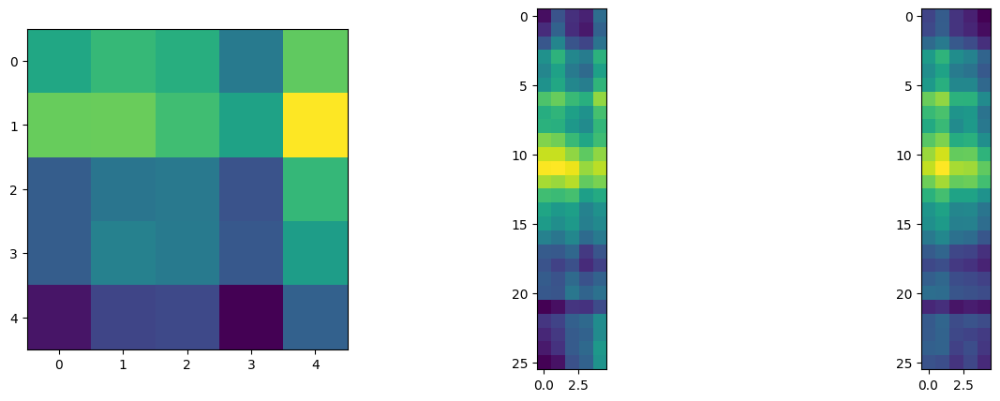

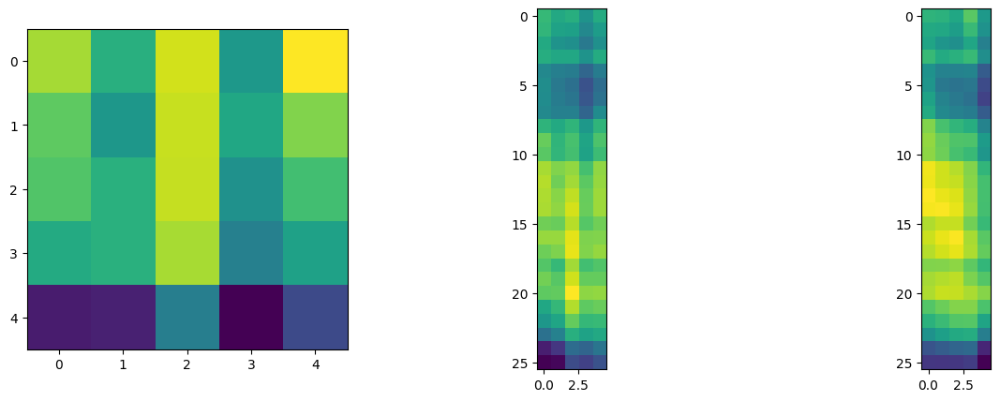

In [110]:
mask = model.rc(torch.ones(1, 1, *X[0].shape))
mask = mask.detach().numpy()
for i in range(mask.shape[1]):
    fig = plot_2d_projections(mask[0, i])
    plt.show()

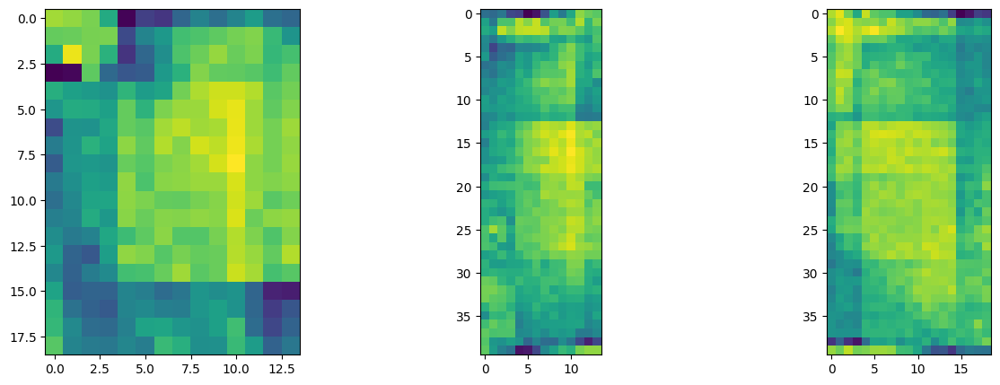

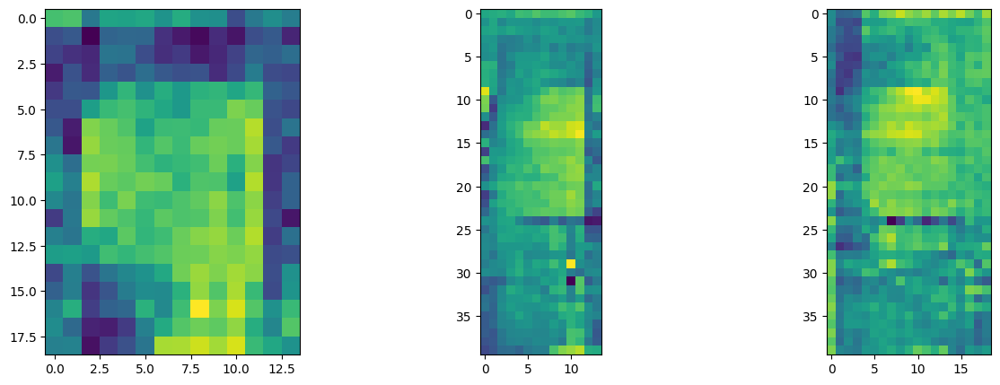

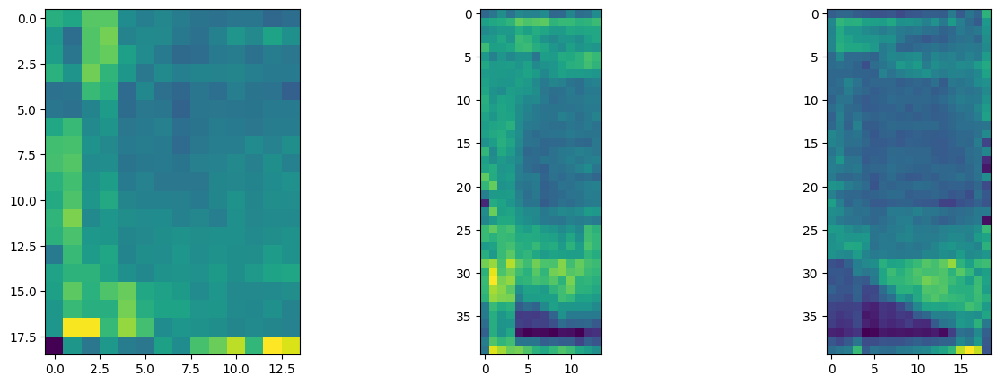

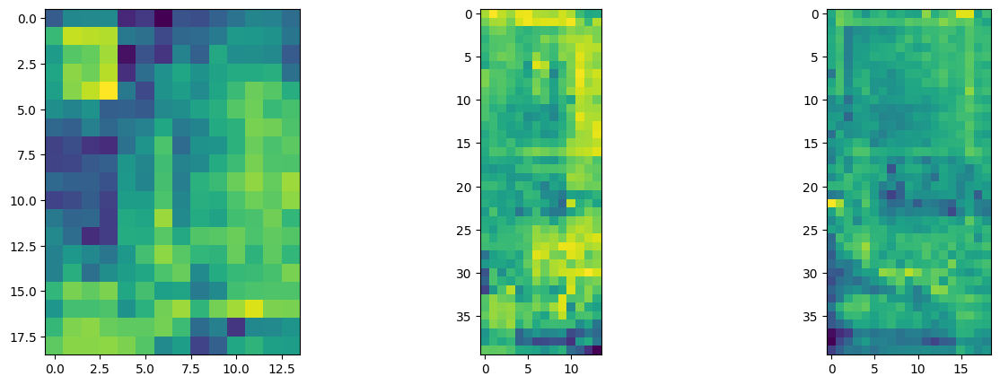

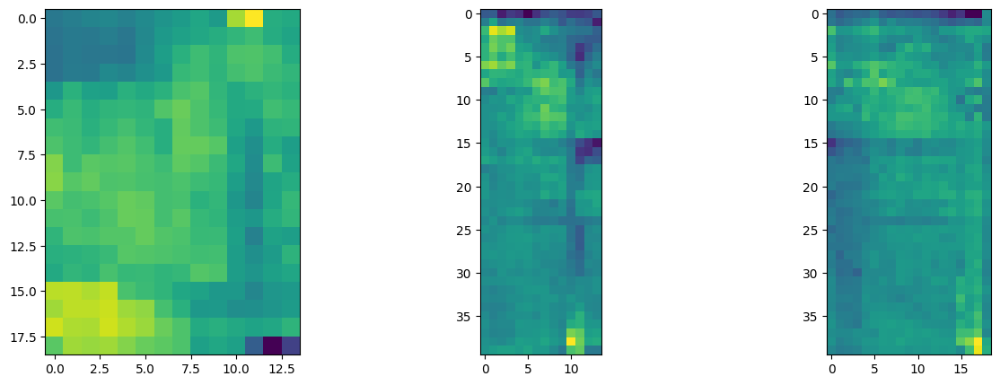

In [121]:
mask = torch.squeeze(get_mask(
    next(iter(DataLoader(test)))[0].shape, model.rc
))
if mask.ndim > 3:
    for i in range(mask.shape[-1]):
        fig = plot_2d_projections(mask.detach()[:, :, :, i])
        plt.show()
else:
    fig = plot_2d_projections(mask.detach()[:, :, :])
    plt.show()